In [ ]:
import dask
print(dask.__version__)


2024.12.1


In [ ]:
pip install rioxarray


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 76.8 MB/s eta 0:00:00


In [ ]:
!pip install stackstac



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 kB 2.3 MB/s eta 0:00:00


In [ ]:
pip install pystac-client


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.2/194.2 kB 4.8 MB/s eta 0:00:00


In [ ]:
pip install planetary-computer


In [ ]:
pip install odc-stac


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.4/89.4 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.1/155.1 kB 8.5 MB/s eta 0:00:00


In [ ]:
  # Supress Warnings
  import warnings
  warnings.filterwarnings('ignore')

  # Import common GIS tools
  import numpy as np
  import xarray as xr
  import matplotlib.pyplot as plt
  import rioxarray as rio
  import rasterio
  from matplotlib.cm import RdYlGn,jet,RdBu

  # Import Planetary Computer tools
  import stackstac
  import pystac_client
  import planetary_computer
  from odc.stac import stac_load

In [ ]:
# Define the bounding box for the entire data region using (Latitude, Longitude)
# This is the region of New York City that contains our temperature dataset
lower_left = (40.75, -74.01)
upper_right = (40.88, -73.86)

In [ ]:
# Calculate the bounds for doing an archive data search
# bounds = (min_lon, min_lat, max_lon, max_lat)
bounds = (lower_left[1], lower_left[0], upper_right[1], upper_right[0])

In [ ]:
# Define the time window
time_window = "2021-06-01/2021-09-01"

In [ ]:
stac = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

search = stac.search(
    bbox=bounds,
    datetime=time_window,
    collections=["sentinel-2-l2a"],
    query={"eo:cloud_cover": {"lt": 30}},
)

In [ ]:
items = list(search.get_items())
print('This is the number of scenes that touch our region:',len(items))

This is the number of scenes that touch our region: 10


In [ ]:
signed_items = [planetary_computer.sign(item).to_dict() for item in items]

In [ ]:


# Define the pixel resolution for the final product
# Define the scale according to our selected crs, so we will use degrees
resolution = 10  # meters per pixel
scale = resolution / 111320.0 # degrees per pixel for crs=4326

In [ ]:
data = stac_load(
    items,
    bands=["B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B11", "B12"],
    crs="EPSG:4326", # Latitude-Longitude
    resolution=scale, # Degrees
    chunks={"x": 2048, "y": 2048},
    dtype="uint16",
    patch_url=planetary_computer.sign,
    bbox=bounds
)

In [ ]:
# View the dimensions of our XARRAY and the loaded variables
# This insures we have the right coordinates and spectral bands in our xarray
display(data)

<xarray.Dataset> Size: 532MB
Dimensions:      (latitude: 1448, longitude: 1671, time: 10)
Coordinates:
  * latitude     (latitude) float64 12kB 40.88 40.88 40.88 ... 40.75 40.75 40.75
  * longitude    (longitude) float64 13kB -74.01 -74.01 -74.01 ... -73.86 -73.86
    spatial_ref  int32 4B 4326
  * time         (time) datetime64[ns] 80B 2021-06-06T15:38:09.024000 ... 202...
Data variables:
    B01          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B02          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B03          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B04          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B05          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B06          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B07          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B08          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B8A          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B11          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>
    B12          (time, latitude, longitude) uint16 48MB dask.array<chunksize=(1, 1448, 1671), meta=np.ndarray>

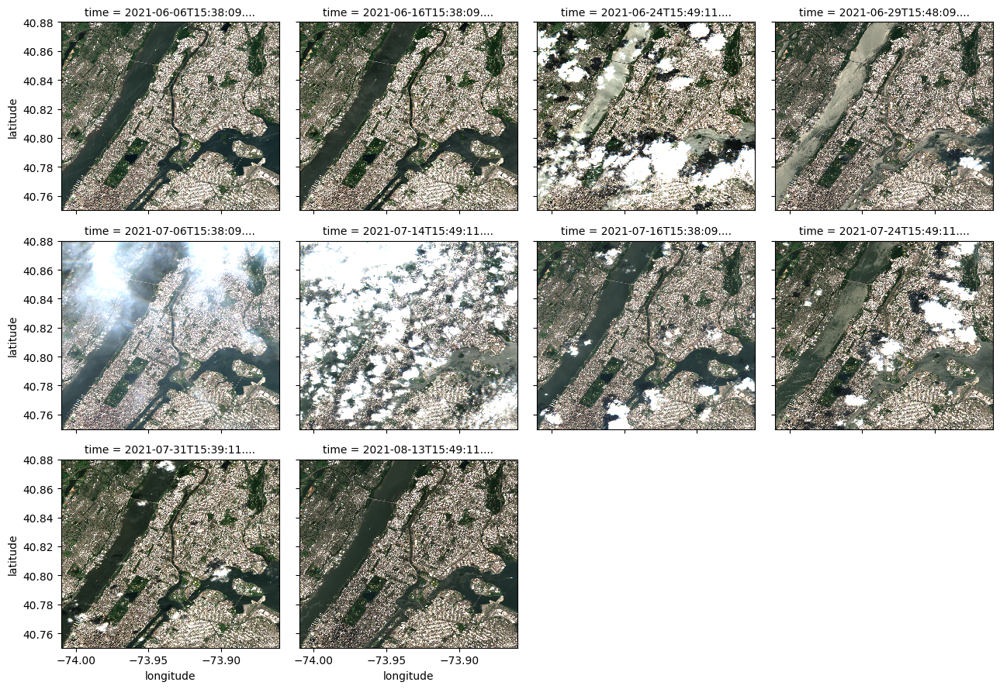

In [ ]:
# Plot sample images from the time series
plot_data = data[["B04","B03","B02"]].to_array()
plot_data.plot.imshow(col='time', col_wrap=4, robust=True, vmin=0, vmax=2500)
plt.show()

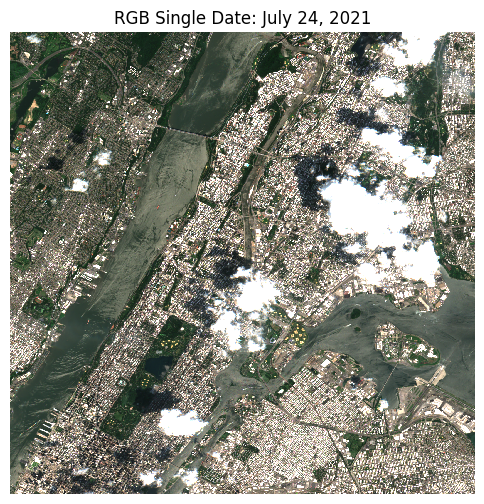

In [ ]:
# Plot an RGB image for a single date
fig, ax = plt.subplots(figsize=(6,6))
plot_data.isel(time=7).plot.imshow(robust=True, ax=ax, vmin=0, vmax=2500)
ax.set_title("RGB Single Date: July 24, 2021")
ax.axis('off')
plt.show()

In [ ]:
median = data.median(dim="time").compute()

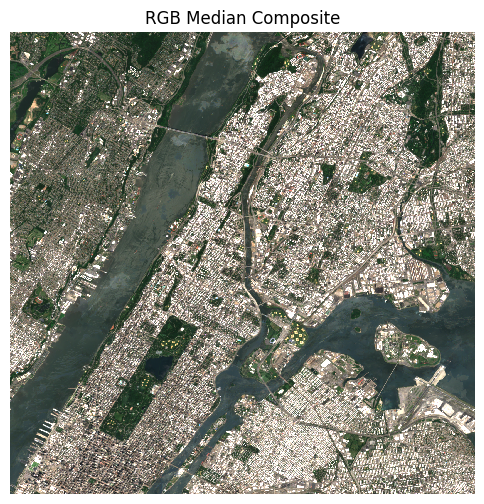

In [ ]:

# Plot an RGB image for the median composite or mosaic
# Notice how this new image is void of clouds due to statistical filtering
fig, ax = plt.subplots(figsize=(6,6))
median[["B04", "B03", "B02"]].to_array().plot.imshow(robust=True, ax=ax, vmin=0, vmax=2500)
ax.set_title("RGB Median Composite")
ax.axis('off')
plt.show()

In [ ]:
# Calculate NDVI for the median mosaic
ndvi_median = (median.B08-median.B04)/(median.B08+median.B04)

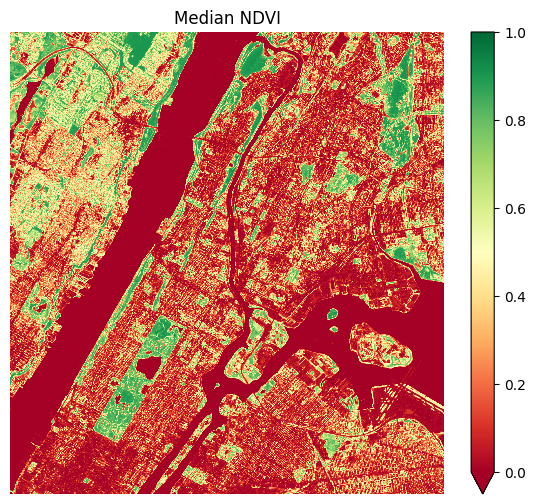

In [ ]:
fig, ax = plt.subplots(figsize=(7,6))
ndvi_median.plot.imshow(vmin=0.0, vmax=1.0, cmap="RdYlGn")
plt.title("Median NDVI")
plt.axis('off')
plt.show()

In [ ]:
# Calculate NDBI for the median mosaic
ndbi_median = (median.B11-median.B08)/(median.B11+median.B08)

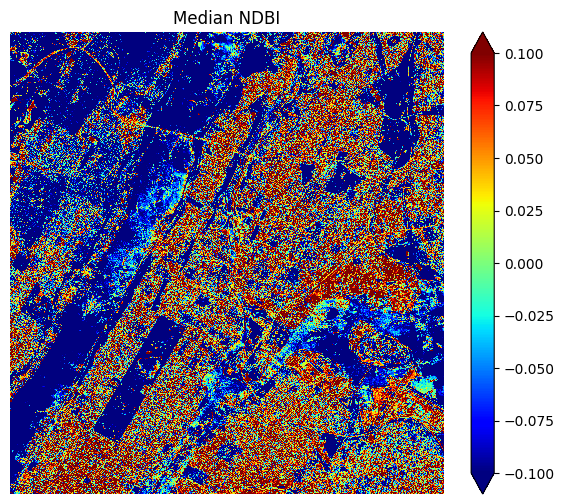

In [ ]:
fig, ax = plt.subplots(figsize=(7,6))
ndbi_median.plot.imshow(vmin=-0.1, vmax=0.1, cmap="jet")
plt.title("Median NDBI")
plt.axis('off')
plt.show()

In [ ]:
# Calculate NDWI for the median mosaic
ndwi_median = (median.B03-median.B08)/(median.B03+median.B08)

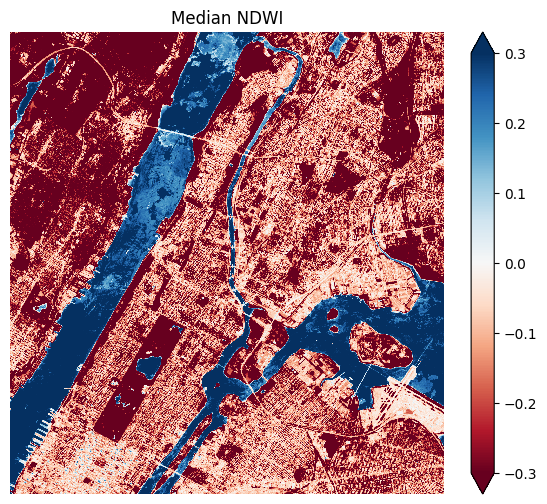

In [ ]:
fig, ax = plt.subplots(figsize=(7,6))
ndwi_median.plot.imshow(vmin=-0.3, vmax=0.3, cmap="RdBu")
plt.title("Median NDWI")
plt.axis('off')
plt.show()

In [ ]:
filename = "S2_sample.tiff"

In [ ]:
# We will pick a single time slice from the time series (time=7)
# This time slice is the date of July 24, 2021
data_slice = data.isel(time=7)

In [ ]:
# Calculate the dimensions of the file
# height = median.dims["latitude"]
# width = median.dims["longitude"]
height = data_slice.dims["latitude"]
width = data_slice.dims["longitude"]

In [ ]:
# Define the Coordinate Reference System (CRS) to be common Lat-Lon coordinates
# Define the tranformation using our bounding box so the Lat-Lon information is written to the GeoTIFF
gt = rasterio.transform.from_bounds(lower_left[1],lower_left[0],upper_right[1],upper_right[0],width,height)
data_slice.rio.write_crs("epsg:4326", inplace=True)
data_slice.rio.write_transform(transform=gt, inplace=True);

In [ ]:
# Create the GeoTIFF output file using the defined parameters
with rasterio.open(filename,'w',driver='GTiff',width=width,height=height,
                   crs='epsg:4326',transform=gt,count=4,compress='lzw',dtype='float64') as dst:
    dst.write(data_slice.B01,1)
    dst.write(data_slice.B04,2)
    dst.write(data_slice.B06,3)
    dst.write(data_slice.B08,4)
    dst.close()

In [ ]:
# Show the location and size of the new output file
!ls *.tiff

Landsat_LST.tiff  S2_sample.tiff


{'driver': 'GTiff', 'dtype': 'float64', 'nodata': None, 'width': 1671, 'height': 1448, 'count': 4, 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'), 'transform': Affine(8.976660682226553e-05, 0.0, -74.01,
       0.0, -8.977900552486364e-05, 40.88)}


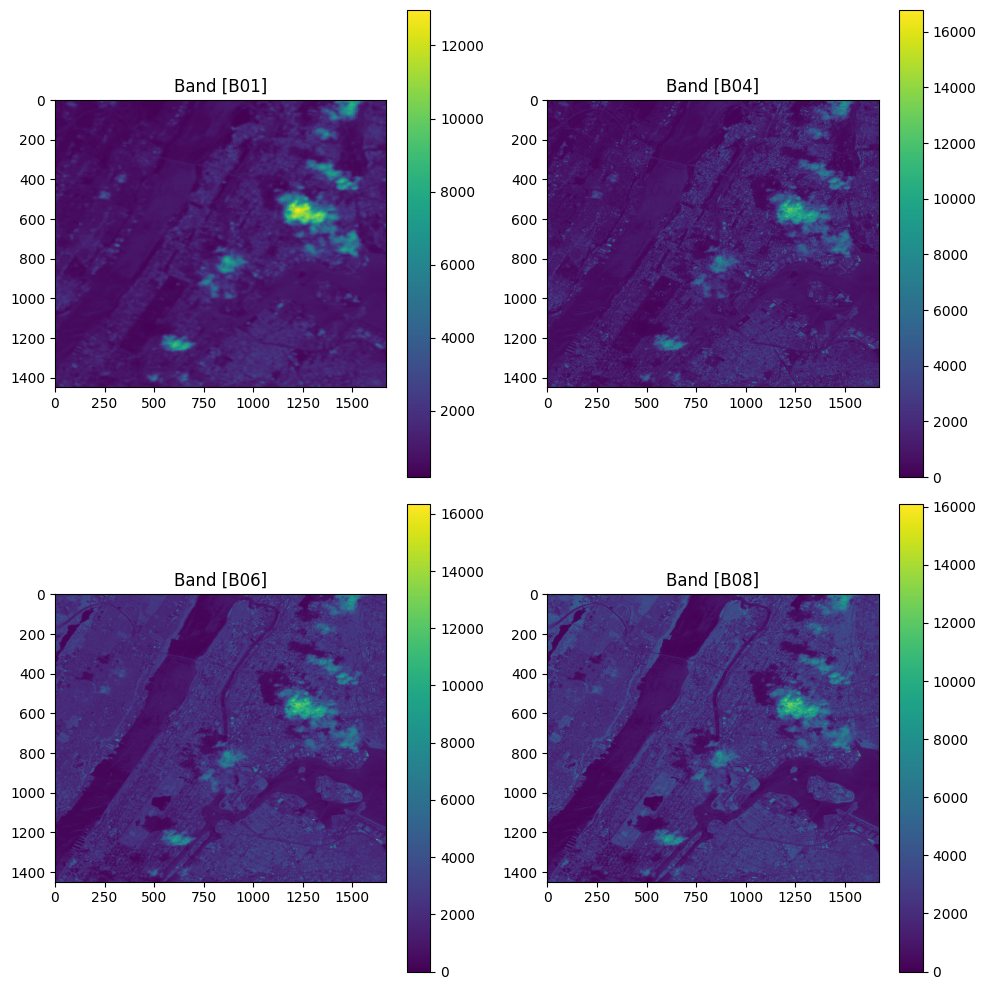

In [ ]:

# Open the TIFF file
with rasterio.open('S2_sample.tiff') as src1:
    print(src1.meta)  # Print metadata to check bands, resolution, etc.
    band1 = src1.read(1)  # Band [B01]
    band2 = src1.read(2)  # Band [B04]
    band3 = src1.read(3)  # Band [B06]
    band4 = src1.read(4)  # Band [B08]

# Plot the bands in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Flatten the axes for easier indexing
axes = axes.flatten()

# Plot the first band (B01)
im1 = axes[0].imshow(band1, cmap='viridis')
axes[0].set_title('Band [B01]')
fig.colorbar(im1, ax=axes[0])

# Plot the second band (B04)
im2 = axes[1].imshow(band2, cmap='viridis')
axes[1].set_title('Band [B04]')
fig.colorbar(im2, ax=axes[1])

# Plot the third band (B06)
im3 = axes[2].imshow(band3, cmap='viridis')
axes[2].set_title('Band [B06]')
fig.colorbar(im3, ax=axes[2])

# Plot the fourth band (B08)
im4 = axes[3].imshow(band4, cmap='viridis')
axes[3].set_title('Band [B08]')
fig.colorbar(im4, ax=axes[3])

plt.tight_layout()
plt.show()


Downloaded Geotiff image (till here important code)

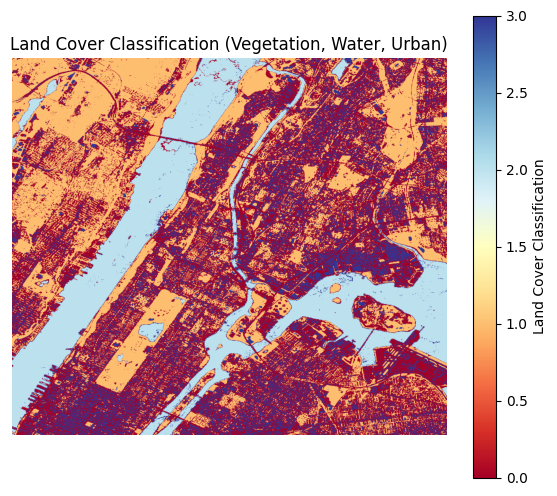

In [ ]:
# Create a classification map based on NDVI, NDBI, and NDWI
# Initialize a classification array (same size as NDVI)
classification = np.zeros_like(ndvi_median)

# Classify vegetation (NDVI > 0.3)
vegetation_mask = ndvi_median > 0.3
classification[vegetation_mask] = 1

# Classify water (NDWI > 0.1)
water_mask = ndwi_median > 0.1
classification[water_mask] = 2

# Classify urban (NDBI > 0.1)
urban_mask = ndbi_median > 0.1
classification[urban_mask] = 3

# Plot the classification map
fig, ax = plt.subplots(figsize=(7,6))
plt.imshow(classification, cmap="RdYlBu", vmin=0, vmax=3)
plt.colorbar(label="Land Cover Classification")
ax.set_title("Land Cover Classification (Vegetation, Water, Urban)")
plt.axis('off')
plt.show()


In [ ]:
# Create GeoTIFF for the classification map
filename_classification = 'sentinel2_classification.tiff'
with rasterio.open(filename_classification, 'w', driver='GTiff', width=width, height=height,
                   crs='epsg:4326', transform=gt, count=1, dtype='uint8') as dst:
    dst.write(classification.astype('uint8'), 1)
    dst.close()


Training data importing and setindex for datetime

In [ ]:
import pandas as pd
csv_path = pd.read_csv('/content/Training_data_uhi_index.csv')

In [ ]:
csv_path.head()

,Longitude,Latitude,datetime,UHI Index
0,-73.909167,40.813107,24-07-2021 15:53,1.030289
1,-73.909187,40.813045,24-07-2021 15:53,1.030289
2,-73.909215,40.812978,24-07-2021 15:53,1.023798
3,-73.909242,40.812908,24-07-2021 15:53,1.023798
4,-73.909257,40.812845,24-07-2021 15:53,1.021634


In [ ]:
from datetime import datetime

csv_path['datetime'] = pd.to_datetime(csv_path['datetime'], format='%d-%m-%Y %H:%M')

csv_path['Month'] = csv_path['datetime'].dt.month
csv_path['Day'] = csv_path['datetime'].dt.day
csv_path['Hour'] = csv_path['datetime'].dt.hour

In [ ]:
csv_path.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11229 entries, 0 to 11228
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Longitude  11229 non-null  float64       
 1   Latitude   11229 non-null  float64       
 2   datetime   11229 non-null  datetime64[ns]
 3   UHI Index  11229 non-null  float64       
 4   Month      11229 non-null  int32         
 5   Day        11229 non-null  int32         
 6   Hour       11229 non-null  int32         
dtypes: datetime64[ns](1), float64(3), int32(3)
memory usage: 482.6 KB


In [ ]:
csv_path.head()

,Longitude,Latitude,datetime,UHI Index,Month,Day,Hour
0,-73.909167,40.813107,2021-07-24 15:53:00,1.030289,7,24,15
1,-73.909187,40.813045,2021-07-24 15:53:00,1.030289,7,24,15
2,-73.909215,40.812978,2021-07-24 15:53:00,1.023798,7,24,15
3,-73.909242,40.812908,2021-07-24 15:53:00,1.023798,7,24,15
4,-73.909257,40.812845,2021-07-24 15:53:00,1.021634,7,24,15


Version 1 code (0.91 r^2 score)

In [ ]:
# with latitude and longitude

Step 1: Visualizing Sentinel-2 bands...


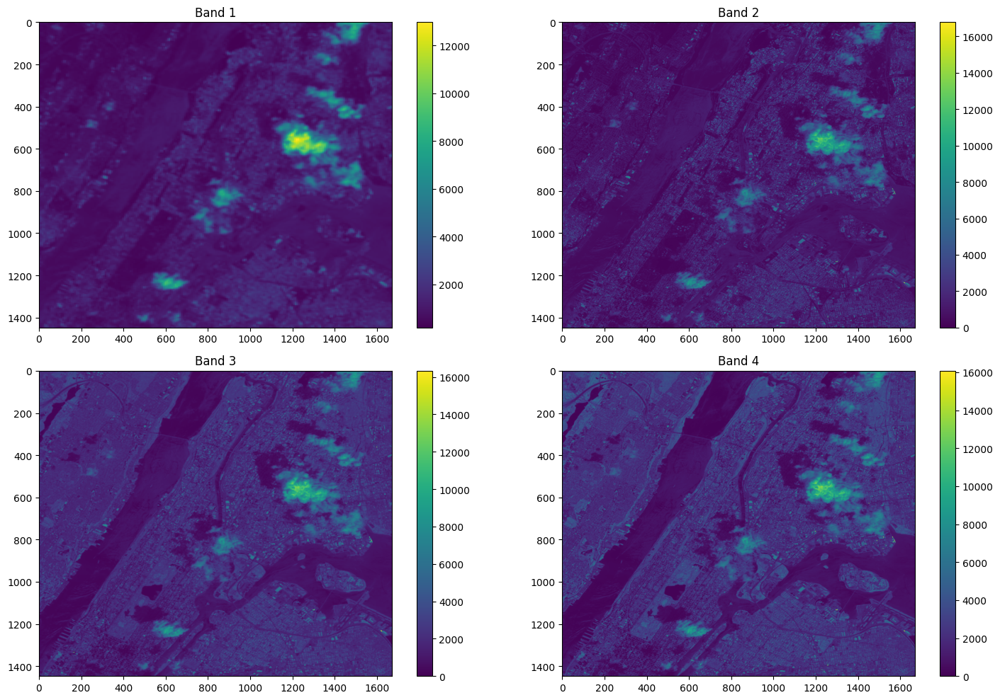

Found 4 bands in the Sentinel-2 data.

Step 2: Extracting satellite data for training locations...


Mapping values: 100%|██████████| 11229/11229 [01:33<00:00, 120.49it/s]



Step 3: Engineering additional features...

Step 4: Preparing data for modeling...
Final dataset shape: (11229, 14)
Features available: B01, B02, B03, B04, Latitude, Longitude, Lat_Lon_Interaction, B01_squared, B01_cubed, Lat_bin, Lon_bin, Coord_bin, datetime, UHI Index

Step 5: Training advanced models...
Random Forest - Train R²: 0.9884, Test R²: 0.9251, Train RMSE: 0.0017, Test RMSE: 0.0044
Gradient Boosting - Train R²: 0.7193, Test R²: 0.7130, Train RMSE: 0.0086, Test RMSE: 0.0087
XGBoost - Train R²: 0.9839, Test R²: 0.9051, Train RMSE: 0.0021, Test RMSE: 0.0050

Training Ensemble Model...
Ensemble - Train R²: 0.9468, Test R²: 0.8889, Train RMSE: 0.0037, Test RMSE: 0.0054
Using Random Forest for final predictions.

Top 10 Most Important Features:
               Feature  Importance
9            Coord_bin    0.454242
4  Lat_Lon_Interaction    0.238191
2                  B03    0.051014
1                  B02    0.044977
8              Lon_bin    0.042777
5          B01_squared    0.

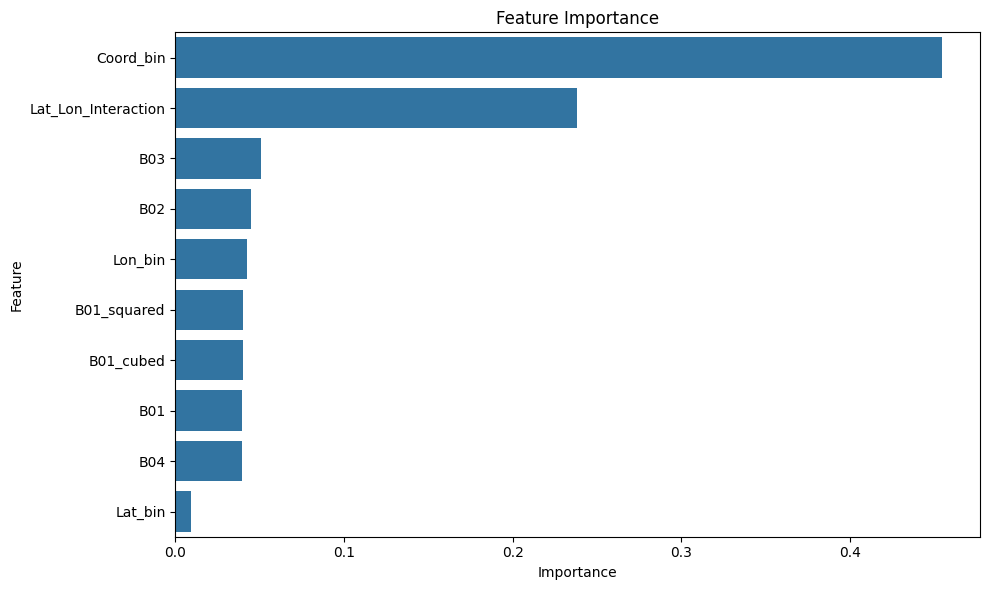


Step 6: Visualizing model results...


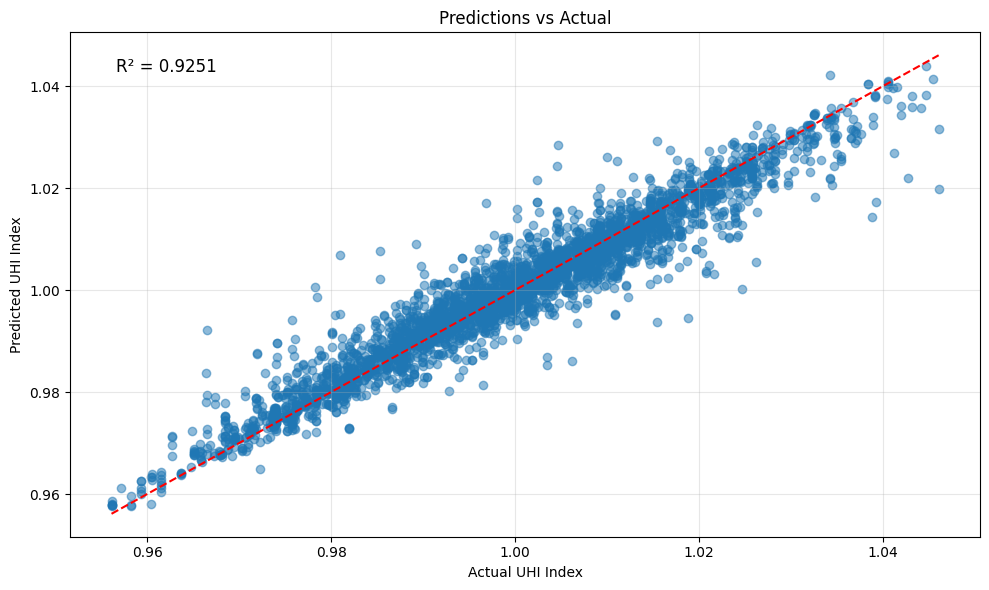

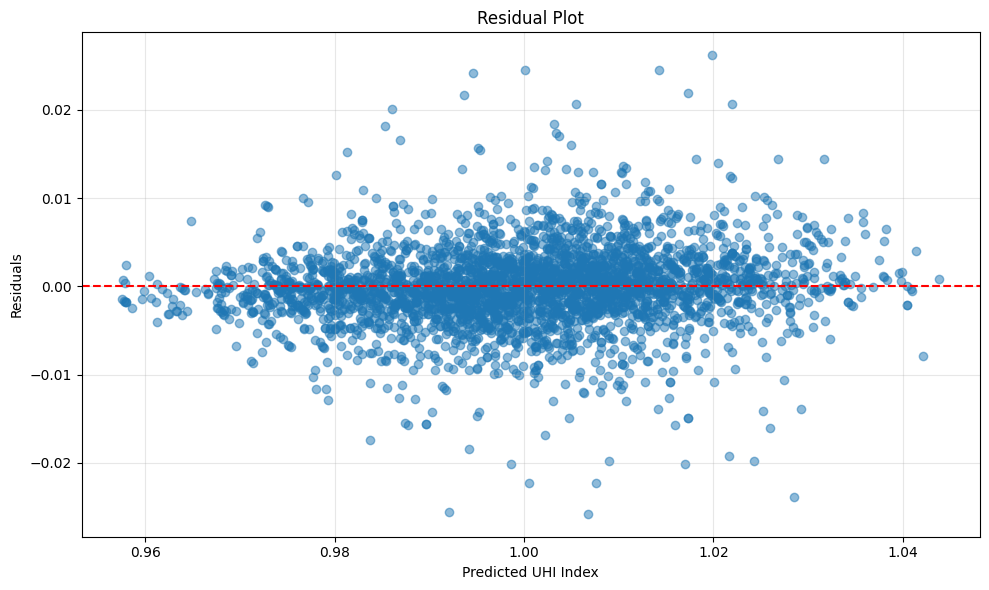

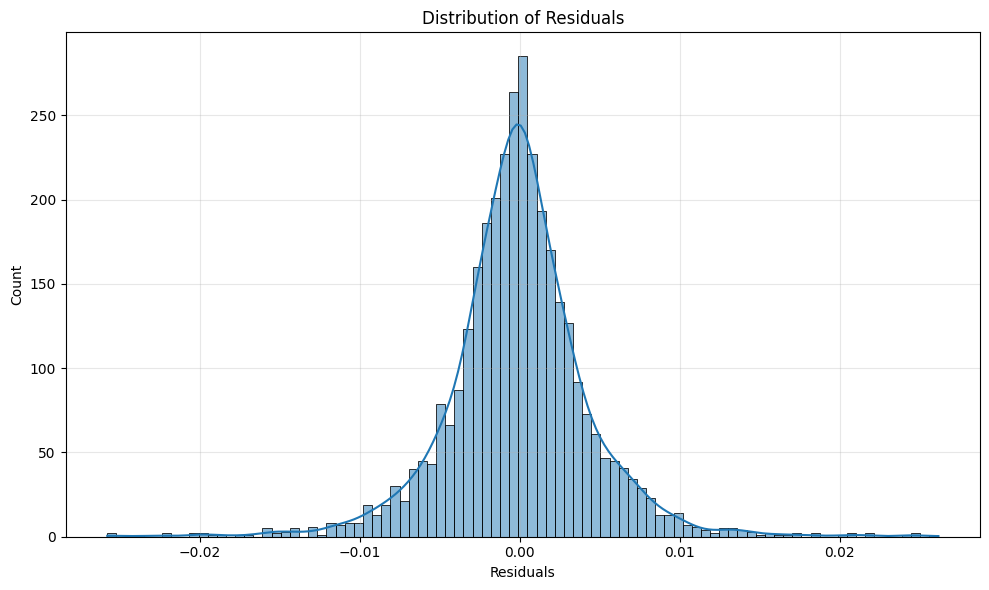


Step 7: Making predictions for submission...


Mapping values: 100%|██████████| 1040/1040 [00:07<00:00, 133.46it/s]


Predictions saved to improved_submission.csv

Workflow completed successfully!


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rioxarray as rxr
import rasterio
from rasterio.mask import mask
from pyproj import Proj, Transformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
from sklearn.linear_model import Lasso
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import VotingRegressor, StackingRegressor
import seaborn as sns
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Define band indices for clarity
B01_IDX = 1  # Aerosols
B02_IDX = 5  # Blue (if present)
B03_IDX = 6  # Green (if present)
B04_IDX = 2  # Red
B05_IDX = 7  # Red Edge (if present)
B06_IDX = 3  # Red Edge
B07_IDX = 8  # Red Edge (if present)
B08_IDX = 4  # NIR
B11_IDX = 9  # SWIR1 (if present)
B12_IDX = 10  # SWIR2 (if present)

def visualize_sentinel_bands(tiff_path):
    """
    Visualize the bands present in the Sentinel-2 GeoTIFF file
    """
    with rasterio.open(tiff_path) as src:
        num_bands = src.count
        fig, axes = plt.subplots(2, (num_bands+1)//2, figsize=(15, 10))
        axes = axes.flatten()

        # Plot each band
        for i in range(num_bands):
            band = src.read(i+1)
            im = axes[i].imshow(band, cmap='viridis')
            axes[i].set_title(f'Band {i+1}')
            fig.colorbar(im, ax=axes[i])

        # Remove empty subplots
        for i in range(num_bands, len(axes)):
            fig.delaxes(axes[i])

        plt.tight_layout()
        plt.show()

        return num_bands

def map_satellite_data(tiff_path, csv_path, additional_indices=True):
    """
    Extract satellite band values at coordinates from CSV
    Calculate additional spectral indices if requested
    """
    # Load the GeoTIFF data
    data = rxr.open_rasterio(tiff_path)
    tiff_crs = data.rio.crs
    num_bands = len(data.band)

    # Read the CSV file
    df = pd.read_csv(csv_path)
    latitudes = df['Latitude'].values
    longitudes = df['Longitude'].values

    # 3. Convert lat/long to the GeoTIFF's CRS if needed
    proj_wgs84 = Proj(init='epsg:4326')  # EPSG:4326 is the common lat/long CRS
    proj_tiff = Proj(tiff_crs)
    transformer = Transformer.from_proj(proj_wgs84, proj_tiff)

    # Initialize dictionaries to store values
    band_values = {f'B{i:02d}': [] for i in range(1, num_bands+1)}

    # Iterate over the latitudes and longitudes, and extract the corresponding band values
    for lat, lon in tqdm(zip(latitudes, longitudes), total=len(latitudes), desc="Mapping values"):
        for i in range(1, num_bands+1):
            band_value = data.sel(x=lon, y=lat, band=i, method="nearest").values
            band_values[f'B{i:02d}'].append(band_value)

    # Create a DataFrame with the band values
    result_df = pd.DataFrame()
    for band_name, values in band_values.items():
        result_df[band_name] = [v.item() if isinstance(v, np.ndarray) else v for v in values]

    # Calculate additional spectral indices if requested
    if additional_indices and 'B04' in result_df.columns and 'B08' in result_df.columns:
        # NDVI (Normalized Difference Vegetation Index)
        result_df['NDVI'] = (result_df['B08'] - result_df['B04']) / (result_df['B08'] + result_df['B04'])
        result_df['NDVI'] = result_df['NDVI'].replace([np.inf, -np.inf], np.nan)

        # Add more indices if bands are available
        if 'B03' in result_df.columns:
            # EVI (Enhanced Vegetation Index)
            result_df['EVI'] = 2.5 * ((result_df['B08'] - result_df['B04']) /
                                   (result_df['B08'] + 6 * result_df['B04'] - 7.5 * result_df['B02'] + 1))
            result_df['EVI'] = result_df['EVI'].replace([np.inf, -np.inf], np.nan)

        if 'B03' in result_df.columns:
            # SAVI (Soil Adjusted Vegetation Index) - L=0.5
            L = 0.5
            result_df['SAVI'] = ((result_df['B08'] - result_df['B04']) /
                                (result_df['B08'] + result_df['B04'] + L)) * (1 + L)
            result_df['SAVI'] = result_df['SAVI'].replace([np.inf, -np.inf], np.nan)

        if 'B11' in result_df.columns:
            # NDBI (Normalized Difference Built-up Index)
            result_df['NDBI'] = (result_df['B11'] - result_df['B08']) / (result_df['B11'] + result_df['B08'])
            result_df['NDBI'] = result_df['NDBI'].replace([np.inf, -np.inf], np.nan)

            # UI (Urban Index)
            result_df['UI'] = (result_df['B11'] - result_df['B04']) / (result_df['B11'] + result_df['B04'])
            result_df['UI'] = result_df['UI'].replace([np.inf, -np.inf], np.nan)

        if 'B02' in result_df.columns and 'B11' in result_df.columns:
            # MNDWI (Modified Normalized Difference Water Index)
            result_df['MNDWI'] = (result_df['B03'] - result_df['B11']) / (result_df['B03'] + result_df['B11'])
            result_df['MNDWI'] = result_df['MNDWI'].replace([np.inf, -np.inf], np.nan)

        if 'B11' in result_df.columns and 'B12' in result_df.columns:
            # NDMI (Normalized Difference Moisture Index)
            result_df['NDMI'] = (result_df['B08'] - result_df['B11']) / (result_df['B08'] + result_df['B11'])
            result_df['NDMI'] = result_df['NDMI'].replace([np.inf, -np.inf], np.nan)

        # BSI (Bare Soil Index)
        if all(col in result_df.columns for col in ['B02', 'B03', 'B04', 'B08', 'B11']):
            result_df['BSI'] = ((result_df['B11'] + result_df['B04']) - (result_df['B08'] + result_df['B02'])) / ((result_df['B11'] + result_df['B04']) + (result_df['B08'] + result_df['B02']))
            result_df['BSI'] = result_df['BSI'].replace([np.inf, -np.inf], np.nan)

        # Add ratio-based features which can be helpful for UHI analysis
        result_df['NIR_Red_Ratio'] = result_df['B08'] / result_df['B04']
        result_df['NIR_Red_Ratio'] = result_df['NIR_Red_Ratio'].replace([np.inf, -np.inf], np.nan)

        if 'B01' in result_df.columns:
            # Aerosol ratio - might correlate with air pollution which affects UHI
            result_df['Aerosol_Ratio'] = result_df['B01'] / result_df['B04']
            result_df['Aerosol_Ratio'] = result_df['Aerosol_Ratio'].replace([np.inf, -np.inf], np.nan)

    # Add original coordinates for spatial analysis
    result_df['Latitude'] = latitudes
    result_df['Longitude'] = longitudes

    # Add engineered spatial features
    result_df['Lat_Lon_Interaction'] = result_df['Latitude'] * result_df['Longitude']

    # Fill NaN values with the median of each column
    result_df = result_df.apply(lambda x: x.fillna(x.median()))

    return result_df

def engineer_additional_features(df):
    """
    Create additional features that might help with UHI prediction
    """
    # Create squared and cubed terms for important variables
    important_features = ['NDVI', 'B01', 'B06']
    for feature in important_features:
        if feature in df.columns:
            df[f'{feature}_squared'] = df[feature] ** 2
            df[f'{feature}_cubed'] = df[feature] ** 3

    # Create interaction terms between key features
    if 'NDVI' in df.columns and 'B01' in df.columns:
        df['NDVI_B01_interaction'] = df['NDVI'] * df['B01']

    if 'NDVI' in df.columns and 'B06' in df.columns:
        df['NDVI_B06_interaction'] = df['NDVI'] * df['B06']

    if 'B01' in df.columns and 'B06' in df.columns:
        df['B01_B06_interaction'] = df['B01'] * df['B06']

    # Create simple cluster-like features based on coordinates
    if 'Latitude' in df.columns and 'Longitude' in df.columns:
        # Binned coordinates to capture neighborhood effects
        df['Lat_bin'] = pd.cut(df['Latitude'], bins=10, labels=False)
        df['Lon_bin'] = pd.cut(df['Longitude'], bins=10, labels=False)
        df['Coord_bin'] = df['Lat_bin'] * 10 + df['Lon_bin']

    return df

def prepare_data_for_modeling(satellite_df, ground_truth_df=None):
    """
    Prepare the data for modeling - handle duplicates, combine with ground truth if provided
    """
    # If ground truth is provided, combine datasets
    if ground_truth_df is not None:
        # Assuming both DataFrames have 'Latitude' and 'Longitude'
        data = pd.merge(satellite_df, ground_truth_df, on=['Latitude', 'Longitude'], how='inner')
    else:
        data = satellite_df.copy()

    # Handle array-type values by converting to scalar if needed
    for col in data.columns:
        # Check if values are numpy arrays and flatten them
        if data[col].apply(lambda x: isinstance(x, np.ndarray)).any():
            data[col] = data[col].apply(lambda x: x.item() if isinstance(x, np.ndarray) and x.size == 1 else x)

    # Remove duplicates
    data = data.drop_duplicates()

    # Reset the index
    data = data.reset_index(drop=True)

    return data

def train_advanced_model(data, target_col='UHI Index', test_size=0.3, random_state=42):
    """
    Train and evaluate multiple models and select the best performing one
    """
    # Prepare the data
    X = data.drop(columns=[target_col, 'Latitude', 'Longitude','datetime'], errors='ignore')
    y = data[target_col]

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Scale the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize models for comparison
    models = {
        'Random Forest': RandomForestRegressor(n_estimators=200, random_state=random_state),
        'Gradient Boosting': GradientBoostingRegressor(n_estimators=200, random_state=random_state),
        'XGBoost': xgb.XGBRegressor(n_estimators=200, random_state=random_state)
    }

    # Train and evaluate each model
    model_scores = {}
    for name, model in models.items():
        # Train the model
        model.fit(X_train_scaled, y_train)

        # Make predictions
        train_preds = model.predict(X_train_scaled)
        test_preds = model.predict(X_test_scaled)

        # Calculate metrics
        train_r2 = r2_score(y_train, train_preds)
        test_r2 = r2_score(y_test, test_preds)
        train_rmse = np.sqrt(mean_squared_error(y_train, train_preds))
        test_rmse = np.sqrt(mean_squared_error(y_test, test_preds))

        print(f"{name} - Train R²: {train_r2:.4f}, Test R²: {test_r2:.4f}, Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}")

        # Store scores
        model_scores[name] = {'model': model, 'test_r2': test_r2, 'test_rmse': test_rmse}

    # Create an ensemble of the top models
    print("\nTraining Ensemble Model...")
    estimators = [(name, model['model']) for name, model in model_scores.items()
                  if model['test_r2'] > 0.45]  # Only include models with decent performance

    if len(estimators) > 1:
        ensemble = VotingRegressor(estimators=estimators)
        ensemble.fit(X_train_scaled, y_train)

        # Evaluate ensemble
        ensemble_train_preds = ensemble.predict(X_train_scaled)
        ensemble_test_preds = ensemble.predict(X_test_scaled)

        ensemble_train_r2 = r2_score(y_train, ensemble_train_preds)
        ensemble_test_r2 = r2_score(y_test, ensemble_test_preds)
        ensemble_train_rmse = np.sqrt(mean_squared_error(y_train, ensemble_train_preds))
        ensemble_test_rmse = np.sqrt(mean_squared_error(y_test, ensemble_test_preds))

        print(f"Ensemble - Train R²: {ensemble_train_r2:.4f}, Test R²: {ensemble_test_r2:.4f}, Train RMSE: {ensemble_train_rmse:.4f}, Test RMSE: {ensemble_test_rmse:.4f}")

        # If ensemble performs better, use it
        if ensemble_test_r2 > max(model['test_r2'] for model in model_scores.values()):
            best_model = ensemble
            print("Using Ensemble Model for final predictions.")
        else:
            # Select best individual model
            best_model_name = max(model_scores, key=lambda k: model_scores[k]['test_r2'])
            best_model = model_scores[best_model_name]['model']
            print(f"Using {best_model_name} for final predictions.")
    else:
        # If not enough good models for ensemble, use the best one
        best_model_name = max(model_scores, key=lambda k: model_scores[k]['test_r2'])
        best_model = model_scores[best_model_name]['model']
        print(f"Using {best_model_name} for final predictions.")

    # Get feature importance from the best model if available
    if hasattr(best_model, 'feature_importances_'):
        importance = best_model.feature_importances_
        feature_importance = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importance
        }).sort_values(by='Importance', ascending=False)

        print("\nTop 10 Most Important Features:")
        print(feature_importance.head(10))

        # Plot feature importance
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance.head(15))
        plt.title('Feature Importance')
        plt.tight_layout()
        plt.show()

    return best_model, scaler, X.columns

def visualize_results(model, X_test, y_test, scaler):
    """
    Visualize the model's predictions vs actual values
    """
    # Scale the test data
    X_test_scaled = scaler.transform(X_test)

    # Make predictions
    predictions = model.predict(X_test_scaled)

    # Create a DataFrame for visualization
    results_df = pd.DataFrame({
        'Actual': y_test,
        'Predicted': predictions
    })

    # Plot predictions vs actual
    plt.figure(figsize=(10, 6))
    plt.scatter(results_df['Actual'], results_df['Predicted'], alpha=0.5)

    # Add perfect prediction line
    min_val = min(results_df['Actual'].min(), results_df['Predicted'].min())
    max_val = max(results_df['Actual'].max(), results_df['Predicted'].max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--')

    plt.xlabel('Actual UHI Index')
    plt.ylabel('Predicted UHI Index')
    plt.title('Predictions vs Actual')
    plt.grid(True, alpha=0.3)

    # Add R² value to the plot
    r2 = r2_score(results_df['Actual'], results_df['Predicted'])
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes,
             fontsize=12, verticalalignment='top')

    plt.tight_layout()
    plt.show()

    # Plot residuals
    results_df['Residuals'] = results_df['Actual'] - results_df['Predicted']

    plt.figure(figsize=(10, 6))
    plt.scatter(results_df['Predicted'], results_df['Residuals'], alpha=0.5)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Predicted UHI Index')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Distribution of residuals
    plt.figure(figsize=(10, 6))
    sns.histplot(results_df['Residuals'], kde=True)
    plt.xlabel('Residuals')
    plt.title('Distribution of Residuals')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def make_predictions(model, scaler, feature_names, submission_data_path, tiff_path):
    """
    Make predictions on new data and save to CSV
    """
    # Load and process submission data
    submission_data = pd.read_csv(submission_data_path)

    # Map satellite data
    submission_features = map_satellite_data(tiff_path, submission_data_path)

    # Engineer additional features
    submission_features = engineer_additional_features(submission_features)

    # Prepare data for prediction
    submission_features = prepare_data_for_modeling(submission_features)

    # Select only the features used during training
    available_features = [col for col in feature_names if col in submission_features.columns]

    # Check if we have all required features
    missing_features = [col for col in feature_names if col not in submission_features.columns]
    if missing_features:
        print(f"Warning: Missing features in submission data: {missing_features}")
        # Add missing features with 0s
        for col in missing_features:
            submission_features[col] = 0

    # Get feature values in the right order
    X_submission = submission_features[feature_names]

    # Scale the features
    X_submission_scaled = scaler.transform(X_submission)

    # Make predictions
    predictions = model.predict(X_submission_scaled)

    # Create submission DataFrame
    submission_df = pd.DataFrame({
        'Longitude': submission_features['Longitude'],
        'Latitude': submission_features['Latitude'],
        'UHI Index': predictions
    })

    # Save to CSV
    submission_path = 'improved_submission.csv'
    submission_df.to_csv(submission_path, index=False)
    print(f"Predictions saved to {submission_path}")

    return submission_df

# Main function to run the entire workflow
def run_uhi_prediction_workflow(sentinel_tiff_path, training_data_path,submission_template_path):
    """
    Run the complete UHI prediction workflow
    """
    print("Step 1: Visualizing Sentinel-2 bands...")
    num_bands = visualize_sentinel_bands(sentinel_tiff_path)
    print(f"Found {num_bands} bands in the Sentinel-2 data.")

    print("\nStep 2: Extracting satellite data for training locations...")
    satellite_data = map_satellite_data(sentinel_tiff_path, training_data_path)

    print("\nStep 3: Engineering additional features...")
    satellite_data = engineer_additional_features(satellite_data)

    print("\nStep 4: Preparing data for modeling...")
    # Load ground truth data
    ground_truth = pd.read_csv(training_data_path)

    # Combine satellite data with ground truth
    modeling_data = prepare_data_for_modeling(satellite_data, ground_truth)

    print(f"Final dataset shape: {modeling_data.shape}")
    print(f"Features available: {', '.join(modeling_data.columns)}")

    print("\nStep 5: Training advanced models...")
    best_model, scaler, feature_names = train_advanced_model(modeling_data)

    print("\nStep 6: Visualizing model results...")
    X = modeling_data.drop(columns=['UHI Index', 'Latitude', 'Longitude','datetime'], errors='ignore')
    y = modeling_data['UHI Index']
    _, X_test, _, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    visualize_results(best_model, X_test, y_test, scaler)

    print("\nStep 7: Making predictions for submission...")
    submission_df = make_predictions(best_model, scaler, feature_names,
                                    submission_template_path, sentinel_tiff_path)

    print("\nWorkflow completed successfully!")
    return best_model, scaler, feature_names, submission_df

# Run the complete workflow
best_model, scaler, feature_names, submission_df = run_uhi_prediction_workflow(
    sentinel_tiff_path="S2_sample.tiff",
    training_data_path="Training_data_uhi_index.csv",
    submission_template_path="Submission_template.csv")


version 2 just for analysis (can be ignore for now)

Loaded Sentinel-2 data with 4 bands
Train RMSE: 0.0044
Test RMSE: 0.0116
Test R²: 0.4948


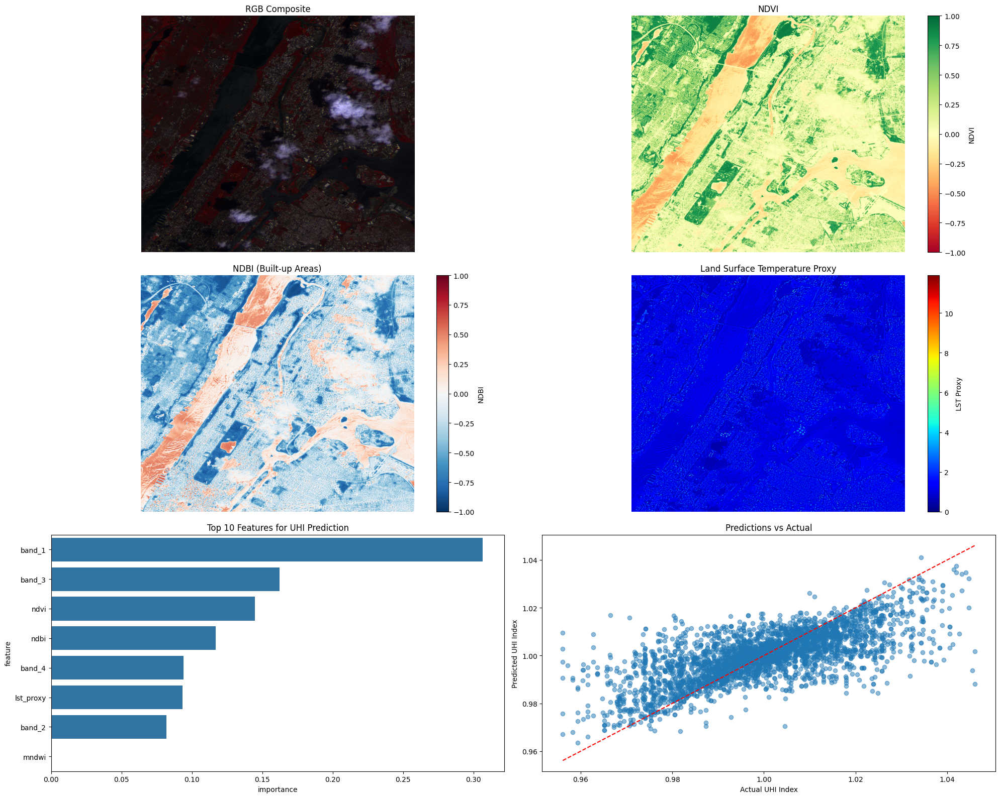

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.mask import mask
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns
from shapely.geometry import Point

# 1. Load the Sentinel-2 TIFF file
def load_sentinel_data(tiff_path):
    """Load Sentinel-2 data from TIFF file"""
    with rasterio.open(tiff_path) as src:
        # Read all bands
        bands = src.read()
        # Get metadata
        meta = src.meta
        # Get band names if available in tags
        band_names = [f"Band_{i+1}" for i in range(src.count)]
        if 'band_names' in src.tags():
            band_names = src.tags()['band_names'].split(',')
        # Get transformation
        transform = src.transform

    print(f"Loaded Sentinel-2 data with {bands.shape[0]} bands")
    return bands, meta, band_names, transform

# 2. Calculate NDVI (Normalized Difference Vegetation Index)
def calculate_ndvi(bands, red_band_idx=1, nir_band_idx=3):
    """Calculate NDVI from red and NIR bands
    Sentinel-2 typical bands: Red = Band 4, NIR = Band 8"""
    red = bands[red_band_idx].astype(float)
    nir = bands[nir_band_idx].astype(float)

    # Avoid division by zero
    ndvi = np.zeros_like(red, dtype=float)
    valid_pixels = (red + nir) != 0
    ndvi[valid_pixels] = (nir[valid_pixels] - red[valid_pixels]) / (nir[valid_pixels] + red[valid_pixels])

    return ndvi

# 3. Calculate NDBI (Normalized Difference Built-up Index)
def calculate_ndbi(bands, swir1_band_idx=0, nir_band_idx=3):
    """Calculate NDBI from SWIR1 and NIR bands
    Sentinel-2 typical bands: SWIR1 = Band 11, NIR = Band 8"""
    swir1 = bands[swir1_band_idx].astype(float)
    nir = bands[nir_band_idx].astype(float)

    # Avoid division by zero
    ndbi = np.zeros_like(swir1, dtype=float)
    valid_pixels = (nir + swir1) != 0
    ndbi[valid_pixels] = (swir1[valid_pixels] - nir[valid_pixels]) / (swir1[valid_pixels] + nir[valid_pixels])

    return ndbi

# 4. Calculate MNDWI (Modified Normalized Difference Water Index)
def calculate_mndwi(bands, green_band_idx=0, swir1_band_idx=0):
    """Calculate MNDWI from Green and SWIR1 bands
    Sentinel-2 typical bands: Green = Band 3, SWIR1 = Band 11"""
    green = bands[green_band_idx].astype(float)
    swir1 = bands[swir1_band_idx].astype(float)

    # Avoid division by zero
    mndwi = np.zeros_like(green, dtype=float)
    valid_pixels = (green + swir1) != 0
    mndwi[valid_pixels] = (green[valid_pixels] - swir1[valid_pixels]) / (green[valid_pixels] + swir1[valid_pixels])

    return mndwi

# 5. Estimate LST (Land Surface Temperature) proxy using thermal-related bands
def estimate_lst_proxy(bands, swir1_band_idx=0, swir2_band_idx=1):
    """Create a proxy for LST using SWIR bands
    This is a simple proxy as Sentinel-2 lacks thermal bands"""
    swir1 = bands[swir1_band_idx].astype(float)
    swir2 = bands[swir2_band_idx].astype(float)

    # Normalized ratio of SWIR bands (higher values may correlate with higher temperatures)
    lst_proxy = swir2 / (swir1 + 0.01)  # Adding small constant to avoid division by zero

    return lst_proxy

# 6. Extract features for sample points
def extract_features_at_points(points_df, bands, indices, transform, point_x_col='Longitude', point_y_col='Latitude'):
    """Extract raster values at point locations"""
    features_df = points_df.copy()

    # Extract band values
    for i, band in enumerate(bands):
        features_df[f'band_{i+1}'] = [band[rasterio.transform.rowcol(transform, x, y)]
                                    for x, y in zip(features_df[point_x_col], features_df[point_y_col])]

    # Extract index values
    for name, idx in indices.items():
        features_df[name] = [idx[rasterio.transform.rowcol(transform, x, y)]
                          for x, y in zip(features_df[point_x_col], features_df[point_y_col])]

    return features_df

# 7. Train a model to predict UHI index
def train_uhi_model(features_df, target_col='UHI Index'):
    """Train a model to predict UHI index values"""
    # Select features (remove non-feature columns)
    non_feature_cols = ['Latitude', 'Longitude', target_col,'datetime']
    feature_cols = [col for col in features_df.columns if col not in non_feature_cols]

    X = features_df[feature_cols]
    y = features_df[target_col]

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train a Random Forest model
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    # Evaluate
    train_preds = model.predict(X_train)
    test_preds = model.predict(X_test)

    train_rmse = np.sqrt(mean_squared_error(y_train, train_preds))
    test_rmse = np.sqrt(mean_squared_error(y_test, test_preds))
    test_r2 = r2_score(y_test, test_preds)

    print(f"Train RMSE: {train_rmse:.4f}")
    print(f"Test RMSE: {test_rmse:.4f}")
    print(f"Test R²: {test_r2:.4f}")

    # Feature importance
    feature_importance = pd.DataFrame({
        'feature': feature_cols,
        'importance': model.feature_importances_
    }).sort_values('importance', ascending=False)

    return model, feature_importance, (X_test, y_test, test_preds)

# 8. Visualize results
def visualize_results(bands, indices, features_df, feature_importance, test_results=None):
    """Create visualizations for analysis"""
    # Create a figure with multiple subplots
    fig = plt.figure(figsize=(20, 16))

    # Plot RGB composite
    ax1 = fig.add_subplot(321)
    # Assuming bands 2,1,0 are B, G, R (adjust as needed)
    rgb = np.stack([bands[2], bands[1], bands[0]], axis=0)
    rgb = np.transpose(rgb, (1, 2, 0))
    # Normalize for visualization
    rgb = rgb / rgb.max(axis=(0,1))
    ax1.imshow(rgb)
    ax1.set_title('RGB Composite')
    ax1.axis('off')

    # Plot NDVI
    ax2 = fig.add_subplot(322)
    ndvi_img = ax2.imshow(indices['ndvi'], cmap='RdYlGn', vmin=-1, vmax=1)
    plt.colorbar(ndvi_img, ax=ax2, label='NDVI')
    ax2.set_title('NDVI')
    ax2.axis('off')

    # Plot NDBI
    ax3 = fig.add_subplot(323)
    ndbi_img = ax3.imshow(indices['ndbi'], cmap='RdBu_r', vmin=-1, vmax=1)
    plt.colorbar(ndbi_img, ax=ax3, label='NDBI')
    ax3.set_title('NDBI (Built-up Areas)')
    ax3.axis('off')

    # Plot LST proxy
    ax4 = fig.add_subplot(324)
    lst_img = ax4.imshow(indices['lst_proxy'], cmap='jet')
    plt.colorbar(lst_img, ax=ax4, label='LST Proxy')
    ax4.set_title('Land Surface Temperature Proxy')
    ax4.axis('off')

    # Plot feature importance
    ax5 = fig.add_subplot(325)
    sns.barplot(x='importance', y='feature', data=feature_importance.head(10), ax=ax5)
    ax5.set_title('Top 10 Features for UHI Prediction')

    # Plot predictions vs actual
    if test_results:
        X_test, y_test, test_preds = test_results
        ax6 = fig.add_subplot(326)
        ax6.scatter(y_test, test_preds, alpha=0.5)
        # Add perfect prediction line
        min_val = min(y_test.min(), test_preds.min())
        max_val = max(y_test.max(), test_preds.max())
        ax6.plot([min_val, max_val], [min_val, max_val], 'r--')
        ax6.set_xlabel('Actual UHI Index')
        ax6.set_ylabel('Predicted UHI Index')
        ax6.set_title('Predictions vs Actual')

    plt.tight_layout()
    plt.savefig('uhi_analysis_results.png', dpi=300)
    plt.show()

# Main execution function
def analyze_uhi_with_sentinel(sentinel_tiff_path, uhi_data_path):
    """Main function to analyze UHI using Sentinel-2 data"""
    # 1. Load Sentinel-2 data
    bands, meta, band_names, transform = load_sentinel_data(sentinel_tiff_path)

    # 2. Calculate indices
    indices = {
        'ndvi': calculate_ndvi(bands),
        'ndbi': calculate_ndbi(bands),
        'mndwi': calculate_mndwi(bands),
        'lst_proxy': estimate_lst_proxy(bands)
    }

    # 3. Load UHI data (assumes CSV with at least latitude, longitude, and uhi_index columns)
    csv_path = pd.read_csv(uhi_data_path)



    # 4. Extract features at sample points
    features_df = extract_features_at_points(csv_path, bands, indices, transform)

    # 5. Train and evaluate model
    model, feature_importance, test_results = train_uhi_model(features_df)

    # 6. Visualize results
    visualize_results(bands, indices, features_df, feature_importance, test_results)

    return model, features_df, feature_importance

# Example usage (uncomment to run):
model, features_df, feature_importance = analyze_uhi_with_sentinel(
    sentinel_tiff_path='S2_sample.tiff',
    uhi_data_path='/content/Training_data_uhi_index_UHI2025-v2.csv'
)

Version 3 (0.53 r^2 score) IMP

In [ ]:
# Without Latitude and Longitude

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rioxarray as rxr
import rasterio
from rasterio.mask import mask
from pyproj import Proj, Transformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
from sklearn.linear_model import Lasso
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import VotingRegressor, StackingRegressor
import seaborn as sns
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Define band indices for clarity
B01_IDX = 1  # Aerosols
B02_IDX = 5  # Blue (if present)
B03_IDX = 6  # Green (if present)
B04_IDX = 2  # Red
B05_IDX = 7  # Red Edge (if present)
B06_IDX = 3  # Red Edge
B07_IDX = 8  # Red Edge (if present)
B08_IDX = 4  # NIR
B11_IDX = 9  # SWIR1 (if present)
B12_IDX = 10  # SWIR2 (if present)

def visualize_sentinel_bands(tiff_path):
    """
    Visualize the bands present in the Sentinel-2 GeoTIFF file
    """
    with rasterio.open(tiff_path) as src:
        num_bands = src.count
        fig, axes = plt.subplots(2, (num_bands+1)//2, figsize=(15, 10))
        axes = axes.flatten()

        # Plot each band
        for i in range(num_bands):
            band = src.read(i+1)
            im = axes[i].imshow(band, cmap='viridis')
            axes[i].set_title(f'Band {i+1}')
            fig.colorbar(im, ax=axes[i])

        # Remove empty subplots
        for i in range(num_bands, len(axes)):
            fig.delaxes(axes[i])

        plt.tight_layout()
        plt.show()

        return num_bands

def map_satellite_data(tiff_path, csv_path, additional_indices=True):
    """
    Extract satellite band values at coordinates from CSV
    Calculate additional spectral indices if requested
    """
    # Load the GeoTIFF data
    data = rxr.open_rasterio(tiff_path)
    tiff_crs = data.rio.crs
    num_bands = len(data.band)

    # Read the CSV file
    df = pd.read_csv(csv_path)
    latitudes = df['Latitude'].values
    longitudes = df['Longitude'].values

    # 3. Convert lat/long to the GeoTIFF's CRS if needed
    proj_wgs84 = Proj(init='epsg:4326')  # EPSG:4326 is the common lat/long CRS
    proj_tiff = Proj(tiff_crs)
    transformer = Transformer.from_proj(proj_wgs84, proj_tiff)

    # Initialize dictionaries to store values
    band_values = {f'B{i:02d}': [] for i in range(1, num_bands+1)}

    # Iterate over the latitudes and longitudes, and extract the corresponding band values
    for lat, lon in tqdm(zip(latitudes, longitudes), total=len(latitudes), desc="Mapping values"):
        for i in range(1, num_bands+1):
            band_value = data.sel(x=lon, y=lat, band=i, method="nearest").values
            band_values[f'B{i:02d}'].append(band_value)

    # Create a DataFrame with the band values
    result_df = pd.DataFrame()
    for band_name, values in band_values.items():
        result_df[band_name] = [v.item() if isinstance(v, np.ndarray) else v for v in values]

    # Calculate additional spectral indices if requested
    if additional_indices and 'B04' in result_df.columns and 'B08' in result_df.columns:
        # NDVI (Normalized Difference Vegetation Index)
        result_df['NDVI'] = (result_df['B08'] - result_df['B04']) / (result_df['B08'] + result_df['B04'])
        result_df['NDVI'] = result_df['NDVI'].replace([np.inf, -np.inf], np.nan)

        # Add more indices if bands are available
        if 'B03' in result_df.columns:
            # EVI (Enhanced Vegetation Index)
            result_df['EVI'] = 2.5 * ((result_df['B08'] - result_df['B04']) /
                                   (result_df['B08'] + 6 * result_df['B04'] - 7.5 * result_df['B02'] + 1))
            result_df['EVI'] = result_df['EVI'].replace([np.inf, -np.inf], np.nan)

        if 'B03' in result_df.columns:
            # SAVI (Soil Adjusted Vegetation Index) - L=0.5
            L = 0.5
            result_df['SAVI'] = ((result_df['B08'] - result_df['B04']) /
                                (result_df['B08'] + result_df['B04'] + L)) * (1 + L)
            result_df['SAVI'] = result_df['SAVI'].replace([np.inf, -np.inf], np.nan)

        if 'B11' in result_df.columns:
            # NDBI (Normalized Difference Built-up Index)
            result_df['NDBI'] = (result_df['B11'] - result_df['B08']) / (result_df['B11'] + result_df['B08'])
            result_df['NDBI'] = result_df['NDBI'].replace([np.inf, -np.inf], np.nan)

            # UI (Urban Index)
            result_df['UI'] = (result_df['B11'] - result_df['B04']) / (result_df['B11'] + result_df['B04'])
            result_df['UI'] = result_df['UI'].replace([np.inf, -np.inf], np.nan)

        if 'B02' in result_df.columns and 'B11' in result_df.columns:
            # MNDWI (Modified Normalized Difference Water Index)
            result_df['MNDWI'] = (result_df['B03'] - result_df['B11']) / (result_df['B03'] + result_df['B11'])
            result_df['MNDWI'] = result_df['MNDWI'].replace([np.inf, -np.inf], np.nan)

        if 'B11' in result_df.columns and 'B12' in result_df.columns:
            # NDMI (Normalized Difference Moisture Index)
            result_df['NDMI'] = (result_df['B08'] - result_df['B11']) / (result_df['B08'] + result_df['B11'])
            result_df['NDMI'] = result_df['NDMI'].replace([np.inf, -np.inf], np.nan)

        # BSI (Bare Soil Index)
        if all(col in result_df.columns for col in ['B02', 'B03', 'B04', 'B08', 'B11']):
            result_df['BSI'] = ((result_df['B11'] + result_df['B04']) - (result_df['B08'] + result_df['B02'])) / ((result_df['B11'] + result_df['B04']) + (result_df['B08'] + result_df['B02']))
            result_df['BSI'] = result_df['BSI'].replace([np.inf, -np.inf], np.nan)

        # Add ratio-based features which can be helpful for UHI analysis
        result_df['NIR_Red_Ratio'] = result_df['B08'] / result_df['B04']
        result_df['NIR_Red_Ratio'] = result_df['NIR_Red_Ratio'].replace([np.inf, -np.inf], np.nan)

        if 'B01' in result_df.columns:
            # Aerosol ratio - might correlate with air pollution which affects UHI
            result_df['Aerosol_Ratio'] = result_df['B01'] / result_df['B04']
            result_df['Aerosol_Ratio'] = result_df['Aerosol_Ratio'].replace([np.inf, -np.inf], np.nan)

    # Add original coordinates for reference only (not for modeling)
    result_df['Latitude'] = latitudes
    result_df['Longitude'] = longitudes

    # Fill NaN values with the median of each column
    result_df = result_df.apply(lambda x: x.fillna(x.median()))

    return result_df

def engineer_additional_features(df):
    """
    Create additional features that might help with UHI prediction,
    excluding any latitude/longitude-based features
    """
    # Create squared and cubed terms for important variables
    important_features = ['NDVI', 'B01', 'B06']
    for feature in important_features:
        if feature in df.columns:
            df[f'{feature}_squared'] = df[feature] ** 2
            df[f'{feature}_cubed'] = df[feature] ** 3

    # Create interaction terms between key features
    if 'NDVI' in df.columns and 'B01' in df.columns:
        df['NDVI_B01_interaction'] = df['NDVI'] * df['B01']

    if 'NDVI' in df.columns and 'B06' in df.columns:
        df['NDVI_B06_interaction'] = df['NDVI'] * df['B06']

    if 'B01' in df.columns and 'B06' in df.columns:
        df['B01_B06_interaction'] = df['B01'] * df['B06']

    # Note: Not creating any Lat/Long-based features as they should not be used for prediction

    return df

def prepare_data_for_modeling(satellite_df, ground_truth_df=None):
    """
    Prepare the data for modeling - handle duplicates, combine with ground truth if provided
    """
    # If ground truth is provided, combine datasets
    if ground_truth_df is not None:
        # Assuming both DataFrames have 'Latitude' and 'Longitude'
        data = pd.merge(satellite_df, ground_truth_df, on=['Latitude', 'Longitude'], how='inner')
    else:
        data = satellite_df.copy()

    # Handle array-type values by converting to scalar if needed
    for col in data.columns:
        # Check if values are numpy arrays and flatten them
        if data[col].apply(lambda x: isinstance(x, np.ndarray)).any():
            data[col] = data[col].apply(lambda x: x.item() if isinstance(x, np.ndarray) and x.size == 1 else x)

    # Remove duplicates
    data = data.drop_duplicates()

    # Reset the index
    data = data.reset_index(drop=True)

    return data

def train_advanced_model(data, target_col='UHI Index', test_size=0.3, random_state=42):
    """
    Train and evaluate multiple models and select the best performing one.
    Ensures latitude and longitude are not used as predictive features.
    """
    # Define location columns that should be excluded from modeling
    location_cols = ['Latitude', 'Longitude', 'datetime']
    # Also exclude any derived location features that might be in the data
    location_derived_cols = [col for col in data.columns if any(x in col.lower() for x in ['lat', 'lon', 'coord'])]

    # Combine all columns to exclude
    cols_to_drop = [target_col] + location_cols + location_derived_cols

    # Prepare the data, removing all location-related columns
    X = data.drop(columns=cols_to_drop, errors='ignore')
    y = data[target_col]

    # Print removed columns for verification
    print(f"Excluded columns (not used for prediction): {[col for col in cols_to_drop if col in data.columns]}")

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Scale the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize models for comparison
    models = {
        'Random Forest': RandomForestRegressor(n_estimators=200, random_state=random_state),
        'Gradient Boosting': GradientBoostingRegressor(n_estimators=200, random_state=random_state),
        'XGBoost': xgb.XGBRegressor(n_estimators=200, random_state=random_state)
    }

    # Train and evaluate each model
    model_scores = {}
    for name, model in models.items():
        # Train the model
        model.fit(X_train_scaled, y_train)

        # Make predictions
        train_preds = model.predict(X_train_scaled)
        test_preds = model.predict(X_test_scaled)

        # Calculate metrics
        train_r2 = r2_score(y_train, train_preds)
        test_r2 = r2_score(y_test, test_preds)
        train_rmse = np.sqrt(mean_squared_error(y_train, train_preds))
        test_rmse = np.sqrt(mean_squared_error(y_test, test_preds))

        print(f"{name} - Train R²: {train_r2:.4f}, Test R²: {test_r2:.4f}, Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}")

        # Store scores
        model_scores[name] = {'model': model, 'test_r2': test_r2, 'test_rmse': test_rmse}

    # Create an ensemble of the top models
    print("\nTraining Ensemble Model...")
    estimators = [(name, model['model']) for name, model in model_scores.items()
                  if model['test_r2'] > 0.45]  # Only include models with decent performance

    if len(estimators) > 1:
        ensemble = VotingRegressor(estimators=estimators)
        ensemble.fit(X_train_scaled, y_train)

        # Evaluate ensemble
        ensemble_train_preds = ensemble.predict(X_train_scaled)
        ensemble_test_preds = ensemble.predict(X_test_scaled)

        ensemble_train_r2 = r2_score(y_train, ensemble_train_preds)
        ensemble_test_r2 = r2_score(y_test, ensemble_test_preds)
        ensemble_train_rmse = np.sqrt(mean_squared_error(y_train, ensemble_train_preds))
        ensemble_test_rmse = np.sqrt(mean_squared_error(y_test, ensemble_test_preds))

        print(f"Ensemble - Train R²: {ensemble_train_r2:.4f}, Test R²: {ensemble_test_r2:.4f}, Train RMSE: {ensemble_train_rmse:.4f}, Test RMSE: {ensemble_test_rmse:.4f}")

        # If ensemble performs better, use it
        if ensemble_test_r2 > max(model['test_r2'] for model in model_scores.values()):
            best_model = ensemble
            print("Using Ensemble Model for final predictions.")
        else:
            # Select best individual model
            best_model_name = max(model_scores, key=lambda k: model_scores[k]['test_r2'])
            best_model = model_scores[best_model_name]['model']
            print(f"Using {best_model_name} for final predictions.")
    else:
        # If not enough good models for ensemble, use the best one
        best_model_name = max(model_scores, key=lambda k: model_scores[k]['test_r2'])
        best_model = model_scores[best_model_name]['model']
        print(f"Using {best_model_name} for final predictions.")

    # Get feature importance from the best model if available
    if hasattr(best_model, 'feature_importances_'):
        importance = best_model.feature_importances_
        feature_importance = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importance
        }).sort_values(by='Importance', ascending=False)

        print("\nTop 10 Most Important Features:")
        print(feature_importance.head(10))

        # Plot feature importance
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance.head(15))
        plt.title('Feature Importance')
        plt.tight_layout()
        plt.show()

    return best_model, scaler, X.columns

def visualize_results(model, X_test, y_test, scaler):
    """
    Visualize the model's predictions vs actual values
    """
    # Scale the test data
    X_test_scaled = scaler.transform(X_test)

    # Make predictions
    predictions = model.predict(X_test_scaled)

    # Create a DataFrame for visualization
    results_df = pd.DataFrame({
        'Actual': y_test,
        'Predicted': predictions
    })

    # Plot predictions vs actual
    plt.figure(figsize=(10, 6))
    plt.scatter(results_df['Actual'], results_df['Predicted'], alpha=0.5)

    # Add perfect prediction line
    min_val = min(results_df['Actual'].min(), results_df['Predicted'].min())
    max_val = max(results_df['Actual'].max(), results_df['Predicted'].max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--')

    plt.xlabel('Actual UHI Index')
    plt.ylabel('Predicted UHI Index')
    plt.title('Predictions vs Actual')
    plt.grid(True, alpha=0.3)

    # Add R² value to the plot
    r2 = r2_score(results_df['Actual'], results_df['Predicted'])
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes,
             fontsize=12, verticalalignment='top')

    plt.tight_layout()
    plt.show()

    # Plot residuals
    results_df['Residuals'] = results_df['Actual'] - results_df['Predicted']

    plt.figure(figsize=(10, 6))
    plt.scatter(results_df['Predicted'], results_df['Residuals'], alpha=0.5)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Predicted UHI Index')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Distribution of residuals
    plt.figure(figsize=(10, 6))
    sns.histplot(results_df['Residuals'], kde=True)
    plt.xlabel('Residuals')
    plt.title('Distribution of Residuals')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def make_predictions(model, scaler, feature_names, submission_data_path, tiff_path):
    """
    Make predictions on new data and save to CSV
    """
    # Load and process submission data
    submission_data = pd.read_csv(submission_data_path)

    # Map satellite data
    submission_features = map_satellite_data(tiff_path, submission_data_path)

    # Engineer additional features
    submission_features = engineer_additional_features(submission_features)

    # Prepare data for prediction
    submission_features = prepare_data_for_modeling(submission_features)

    # Select only the features used during training
    available_features = [col for col in feature_names if col in submission_features.columns]

    # Check if we have all required features
    missing_features = [col for col in feature_names if col not in submission_features.columns]
    if missing_features:
        print(f"Warning: Missing features in submission data: {missing_features}")
        # Add missing features with 0s
        for col in missing_features:
            submission_features[col] = 0

    # Get feature values in the right order
    X_submission = submission_features[feature_names]

    # Scale the features
    X_submission_scaled = scaler.transform(X_submission)

    # Make predictions
    predictions = model.predict(X_submission_scaled)

    # Create submission DataFrame
    submission_df = pd.DataFrame({
        'Longitude': submission_features['Longitude'],
        'Latitude': submission_features['Latitude'],
        'UHI Index': predictions
    })

    # Save to CSV
    submission_path = 'improved_submission.csv'
    submission_df.to_csv(submission_path, index=False)
    print(f"Predictions saved to {submission_path}")

    return submission_df

# Main function to run the entire workflow
def run_uhi_prediction_workflow(sentinel_tiff_path, training_data_path, submission_template_path):
    """
    Run the complete UHI prediction workflow
    """
    print("Step 1: Visualizing Sentinel-2 bands...")
    num_bands = visualize_sentinel_bands(sentinel_tiff_path)
    print(f"Found {num_bands} bands in the Sentinel-2 data.")

    print("\nStep 2: Extracting satellite data for training locations...")
    satellite_data = map_satellite_data(sentinel_tiff_path, training_data_path)

    print("\nStep 3: Engineering additional features...")
    satellite_data = engineer_additional_features(satellite_data)

    print("\nStep 4: Preparing data for modeling...")
    # Load ground truth data
    ground_truth = pd.read_csv(training_data_path)

    # Combine satellite data with ground truth
    modeling_data = prepare_data_for_modeling(satellite_data, ground_truth)

    print(f"Final dataset shape: {modeling_data.shape}")
    print(f"Features available: {', '.join(modeling_data.columns)}")

    print("\nStep 5: Training advanced models...")
    best_model, scaler, feature_names = train_advanced_model(modeling_data)

    print("\nStep 6: Visualizing model results...")
    # Define location columns that should be excluded from modeling
    location_cols = ['Latitude', 'Longitude', 'datetime']
    # Also exclude any derived location features that might be in the data
    location_derived_cols = [col for col in modeling_data.columns if any(x in col.lower() for x in ['lat', 'lon', 'coord'])]

    # Combine all columns to exclude
    cols_to_drop = ['UHI Index'] + location_cols + location_derived_cols

    X = modeling_data.drop(columns=cols_to_drop, errors='ignore')
    y = modeling_data['UHI Index']
    _, X_test, _, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    visualize_results(best_model, X_test, y_test, scaler)

    print("\nStep 7: Making predictions for submission...")
    submission_df = make_predictions(best_model, scaler, feature_names,
                                    submission_template_path, sentinel_tiff_path)

    print("\nWorkflow completed successfully!")
    return best_model, scaler, feature_names, submission_df

# Run the complete workflow
best_model, scaler, feature_names, submission_df = run_uhi_prediction_workflow(
    sentinel_tiff_path="S2_sample.tiff",
    training_data_path="Training_data_uhi_index.csv",
    submission_template_path="Submission_template.csv")

(final)Version 4 (Improving above version)

In [ ]:
# improved version of above code

In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.8/231.8 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 5.9 MB/s eta 0:00:00


Extracting LST values: 100%|██████████| 11229/11229 [00:08<00:00, 1363.56it/s]


Columns after adding LST: Index(['B01', 'B02', 'B03', 'B04', 'LST'], dtype='object')
Top 10 features selected:
1. LST: 1.0000
2. B01_recip: 0.8516
3. B01_log: 0.7417
4. B01_sqrt: 0.7416
5. B01_squared: 0.7278
6. B01: 0.7165
7. B02_recip: 0.6482
8. B02_log: 0.6468
9. B03_recip: 0.5975
10. B03_sqrt: 0.5913
Cross-Validation RMSE: 0.0090 (±0.0003)
Test RMSE: 0.0078
Test R²: 0.7698


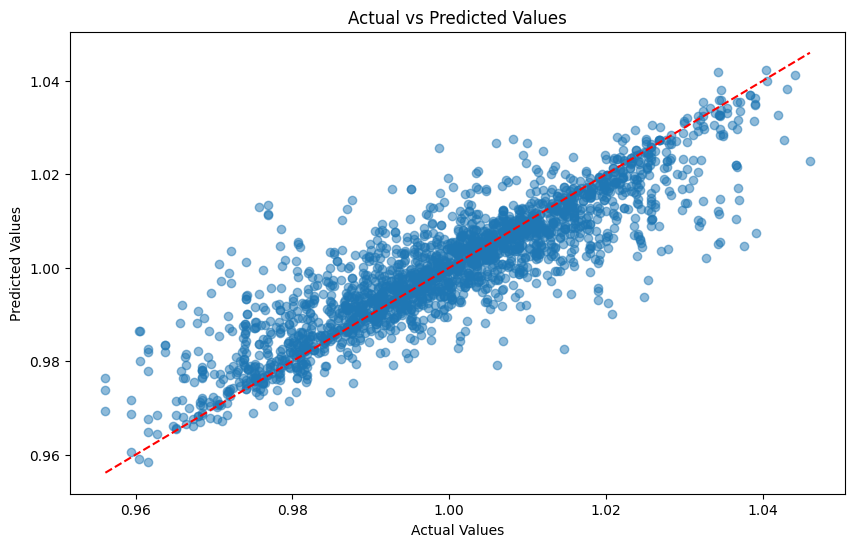

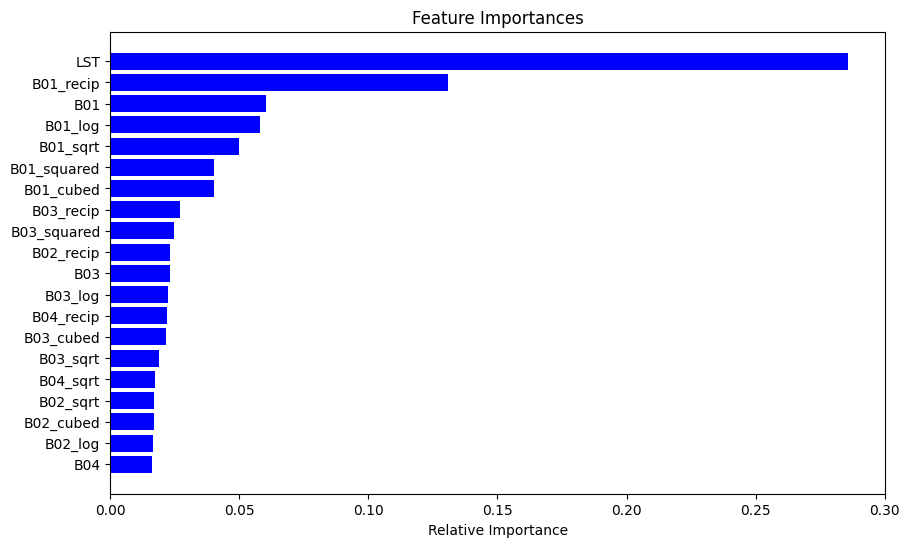

Extracting LST values: 100%|██████████| 1040/1040 [00:00<00:00, 1339.42it/s]


Columns after adding LST: Index(['B01', 'B02', 'B03', 'B04', 'LST'], dtype='object')
Predictions saved to submission.csv
    Latitude  Longitude  UHI Index
0  40.788763 -73.971665   0.964566
1  40.788875 -73.971928   0.964362
2  40.789080 -73.967080   0.976238
3  40.789082 -73.972550   0.982217
4  40.787953 -73.969697   0.966452


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rioxarray as rxr
import rasterio
from rasterio.mask import mask
from pyproj import Proj, Transformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, RobustScaler, PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
from sklearn.linear_model import ElasticNet, Lasso, Ridge
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel, RFE, RFECV
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import VotingRegressor, StackingRegressor, BaggingRegressor
from sklearn.svm import SVR
from sklearn.kernel_ridge import KernelRidge
import seaborn as sns
from tqdm import tqdm
import optuna
import logging
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Define band indices for clarity (update these based on your TIFF file)
B01_IDX = 1  # Aerosols
B02_IDX = 5  # Blue (if present)
B03_IDX = 6  # Green (if present)
B04_IDX = 2  # Red
B05_IDX = 7  # Red Edge (if present)
B06_IDX = 3  # Red Edge
B07_IDX = 8  # Red Edge (if present)
B08_IDX = 4  # NIR
B11_IDX = 9  # SWIR1 (if present)
B12_IDX = 10  # SWIR2 (if present)

def visualize_sentinel_bands(tiff_path):
    """
    Visualize the bands present in the Sentinel-2 GeoTIFF file
    """
    with rasterio.open(tiff_path) as src:
        num_bands = src.count
        fig, axes = plt.subplots(2, (num_bands+1)//2, figsize=(15, 10))
        axes = axes.flatten()

        # Plot each band
        for i in range(num_bands):
            band = src.read(i+1)
            im = axes[i].imshow(band, cmap='viridis')
            axes[i].set_title(f'Band {i+1}')
            fig.colorbar(im, ax=axes[i])

        # Remove empty subplots
        for i in range(num_bands, len(axes)):
            fig.delaxes(axes[i])

        plt.tight_layout()
        plt.show()

        return num_bands



def map_satellite_data(tiff_path, csv_path, landsat_lst_path=None, additional_indices=True):
    """
    Extract satellite band values at coordinates from CSV.
    Calculate additional spectral indices if requested.
    Include Landsat LST data if provided.
    """
    # Load the Sentinel-2 GeoTIFF data
    data = rxr.open_rasterio(tiff_path)
    tiff_crs = data.rio.crs
    num_bands = len(data.band)

    # Read the CSV file
    df = pd.read_csv(csv_path)
    latitudes = df['Latitude'].values
    longitudes = df['Longitude'].values

    # Convert lat/long to the GeoTIFF's CRS if needed
    proj_wgs84 = Proj(init='epsg:4326')  # EPSG:4326 is the common lat/long CRS
    proj_tiff = Proj(tiff_crs)
    transformer = Transformer.from_proj(proj_wgs84, proj_tiff)

    # Initialize dictionaries to store values
    band_values = {f'B{i:02d}': [] for i in range(1, num_bands+1)}

    # Iterate over the latitudes and longitudes, and extract the corresponding band values
    for lat, lon in tqdm(zip(latitudes, longitudes), total=len(latitudes), desc="Mapping values"):
        for i in range(1, num_bands+1):
            band_value = data.sel(x=lon, y=lat, band=i, method="nearest").values
            band_values[f'B{i:02d}'].append(band_value.item() if isinstance(band_value, np.ndarray) else band_value)

    # Create a DataFrame with the band values
    result_df = pd.DataFrame()
    for band_name, values in band_values.items():
        result_df[band_name] = values

    # Add Landsat LST data if provided
    if landsat_lst_path:
        lst_values = extract_landsat_lst(landsat_lst_path, latitudes, longitudes)
        result_df['LST'] = lst_values
        print("Columns after adding LST:", result_df.columns)

    # Calculate additional spectral indices if requested
    if additional_indices:
        # Check if required bands are present before calculating indices
        if 'B04' in result_df.columns and 'B08' in result_df.columns:
            # NDVI (Normalized Difference Vegetation Index)
            result_df['NDVI'] = (result_df['B08'] - result_df['B04']) / (result_df['B08'] + result_df['B04'] + 1e-10)
            result_df['NDVI'] = result_df['NDVI'].replace([np.inf, -np.inf], np.nan)

        # Add other indices similarly, checking for required bands
        # ...

    # Add original coordinates for reference only (not for modeling)
    result_df['Latitude'] = latitudes
    result_df['Longitude'] = longitudes

    # Fill NaN values with the median of each column
    result_df = result_df.apply(lambda x: x.fillna(x.median()))

    return result_df



# def map_satellite_data(tiff_path, csv_path, additional_indices=True):
#     """
#     Extract satellite band values at coordinates from CSV
#     Calculate additional spectral indices if requested
#     """
#     # Load the GeoTIFF data
#     data = rxr.open_rasterio(tiff_path)
#     tiff_crs = data.rio.crs
#     num_bands = len(data.band)

#     # Read the CSV file
#     df = pd.read_csv(csv_path)
#     latitudes = df['Latitude'].values
#     longitudes = df['Longitude'].values

#     # # Convert datetime column to datetime objects
#     # df['datetime'] = pd.to_datetime(df['datetime'], format='%d-%m-%Y %H:%M', errors='coerce')

#     # # Extract datetime features
#     # df['Month'] = df['datetime'].dt.month
#     # df['Day'] = df['datetime'].dt.day
#     # df['Hour'] = df['datetime'].dt.hour

#     # Convert lat/long to the GeoTIFF's CRS if needed
#     proj_wgs84 = Proj(init='epsg:4326')  # EPSG:4326 is the common lat/long CRS
#     proj_tiff = Proj(tiff_crs)
#     transformer = Transformer.from_proj(proj_wgs84, proj_tiff)

#     # Initialize dictionaries to store values
#     band_values = {f'B{i:02d}': [] for i in range(1, num_bands+1)}

#     # Iterate over the latitudes and longitudes, and extract the corresponding band values
#     for lat, lon in tqdm(zip(latitudes, longitudes), total=len(latitudes), desc="Mapping values"):
#         for i in range(1, num_bands+1):
#             band_value = data.sel(x=lon, y=lat, band=i, method="nearest").values
#             band_values[f'B{i:02d}'].append(band_value)

#     # Create a DataFrame with the band values
#     result_df = pd.DataFrame()
#     for band_name, values in band_values.items():
#         result_df[band_name] = [v.item() if isinstance(v, np.ndarray) else v for v in values]

#     # Add datetime features to the result DataFrame
#     # result_df['Month'] = df['Month']
#     # result_df['Day'] = df['Day']
#     # result_df['Hour'] = df['Hour']

#     # Calculate additional spectral indices if requested
#     if additional_indices:
#         # Check if required bands are present before calculating indices
#         if 'B04' in result_df.columns and 'B08' in result_df.columns:
#             # NDVI (Normalized Difference Vegetation Index)
#             result_df['NDVI'] = (result_df['B08'] - result_df['B04']) / (result_df['B08'] + result_df['B04'] + 1e-10)
#             result_df['NDVI'] = result_df['NDVI'].replace([np.inf, -np.inf], np.nan)

#         # Add other indices similarly, checking for required bands
#         # ...

#     # Add original coordinates for reference only (not for modeling)
#     result_df['Latitude'] = latitudes
#     result_df['Longitude'] = longitudes

#     # Fill NaN values with the median of each column
#     result_df = result_df.apply(lambda x: x.fillna(x.median()))

#     return result_df

def engineer_additional_features(df):
    """
    Create additional features that might help with UHI prediction,
    excluding any latitude/longitude-based features
    """
    # IMPROVED: More sophisticated feature engineering

    # Create squared and cubed terms for a wider range of features
    important_features = [col for col in df.columns if col.startswith(('NDVI', 'EVI', 'SAVI', 'BSI', 'NDBI', 'UI', 'B')) and col in df.columns]

    for feature in important_features:
        # Skip lat/long and any columns that might already be squared or cubed
        if feature in df.columns and not feature.endswith(('squared', 'cubed', 'log', 'sqrt', 'recip')) and not feature in ['Latitude', 'Longitude']:
            df[f'{feature}_squared'] = df[feature] ** 2
            df[f'{feature}_cubed'] = df[feature] ** 3
            df[f'{feature}_log'] = np.log1p(np.abs(df[feature]))  # Log transform (with 1+ for negative values)
            df[f'{feature}_sqrt'] = np.sqrt(np.abs(df[feature]))  # Square root transform
            df[f'{feature}_recip'] = 1 / (np.abs(df[feature]) + 1e-10)  # Reciprocal transform

    # Create interaction terms between key indices
    index_features = [col for col in df.columns if any(x in col for x in ['NDVI', 'EVI', 'BSI', 'UI', 'NDBI', 'SAVI'])]
    band_features = [col for col in df.columns if col.startswith('B')]

    # Create interaction between indices and bands
    if len(index_features) > 0 and len(band_features) > 0:
        # Select up to 5 of each type to avoid too many features
        selected_indices = index_features[:min(5, len(index_features))]
        selected_bands = band_features[:min(5, len(band_features))]

        for idx in selected_indices:
            for band in selected_bands:
                df[f'{idx}_{band}_interaction'] = df[idx] * df[band]

    # Create interaction among indices
    if len(index_features) >= 2:
        for i, idx1 in enumerate(index_features[:min(4, len(index_features))]):
            for idx2 in index_features[i+1:min(i+3, len(index_features))]:
                df[f'{idx1}_{idx2}_interaction'] = df[idx1] * df[idx2]

    # Create ratios between indices
    if len(index_features) >= 2:
        for i, idx1 in enumerate(index_features[:min(4, len(index_features))]):
            for idx2 in index_features[i+1:min(i+3, len(index_features))]:
                df[f'{idx1}_{idx2}_ratio'] = df[idx1] / (df[idx2] + 1e-10)
                df[f'{idx1}_{idx2}_ratio'] = df[f'{idx1}_{idx2}_ratio'].replace([np.inf, -np.inf], np.nan)

    # Create band arithmetic combinations
    if all(f'B{i:02d}' in df.columns for i in [4, 8, 11]):
        # (NIR-Red)/(SWIR-Red) - related to vegetation stress and water content
        df['NIR_Red_SWIR_Ratio'] = (df['B08'] - df['B04']) / (df['B11'] - df['B04'] + 1e-10)
        df['NIR_Red_SWIR_Ratio'] = df['NIR_Red_SWIR_Ratio'].replace([np.inf, -np.inf], np.nan)

    # Urban indices specific for UHI
    if all(f'B{i:02d}' in df.columns for i in [2, 4, 8, 11]):
        # Urban Density Index - emphasizes built-up areas
        df['UDI'] = (df['B11'] - df['B08']) * (df['B04'] - df['B02']) / (1e-10 + (df['B11'] + df['B08']) * (df['B04'] + df['B02']))
        df['UDI'] = df['UDI'].replace([np.inf, -np.inf], np.nan)

    # PCA-inspired features (simplified approximation)
    # Note: This isn't actual PCA but creates combinations inspired by typical principal components
    if all(f'B{i:02d}' in df.columns for i in [2, 3, 4, 8]):
        df['PC1_proxy'] = 0.5*df['B02'] + 0.5*df['B03'] + 0.5*df['B04'] + 0.5*df['B08']  # Brightness
        df['PC2_proxy'] = -0.4*df['B02'] - 0.4*df['B03'] + 0.4*df['B04'] + 0.6*df['B08']  # Greenness
        df['PC3_proxy'] = 0.3*df['B02'] - 0.6*df['B03'] + 0.5*df['B04'] - 0.4*df['B08']  # Wetness

    # Add urban-specific indices
    if 'NDVI' in df.columns and 'NDBI' in df.columns:
        # BUI (Built-Up Index) - highlights built-up areas
        df['BUI'] = df['NDBI'] - df['NDVI']

        # EBBI (Enhanced Built-Up and Bareness Index)
        if 'B11' in df.columns and 'B04' in df.columns:
            df['EBBI_proxy'] = (df['B11'] - df['B04']) / (10 * np.sqrt(df['B11'] + df['B04'] + 1e-10))
            df['EBBI_proxy'] = df['EBBI_proxy'].replace([np.inf, -np.inf], np.nan)

    # UHI-specific combinations (based on literature)
    if 'NDVI' in df.columns and 'NDBI' in df.columns:
        # Normalized UHI index (NUHII) proxy
        df['NUHII_proxy'] = (df['NDBI'] - df['NDVI']) / (df['NDBI'] + df['NDVI'] + 1e-10)
        df['NUHII_proxy'] = df['NUHII_proxy'].replace([np.inf, -np.inf], np.nan)

    # Remove any lat/long derived features that might have been created
    columns_to_drop = [col for col in df.columns if any(x in col.lower() for x in ['lat_', 'lon_', 'latitude_', 'longitude_', 'coord_'])]
    df = df.drop(columns=columns_to_drop, errors='ignore')

    # Fill NaN values with the median of each column
    df = df.fillna(df.median())

    return df

def perform_feature_selection(X, y, n_features=50):
    """
    Use multiple feature selection methods and combine them for more robust selection
    """
    # Initialize results dictionary to store feature scores
    feature_scores = {feature: 0 for feature in X.columns}

    # Method 1: Random Forest importance
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X, y)
    rf_importances = rf.feature_importances_
    for i, feature in enumerate(X.columns):
        feature_scores[feature] += rf_importances[i]

    # Method 2: Gradient Boosting importance
    gb = GradientBoostingRegressor(n_estimators=100, random_state=42)
    gb.fit(X, y)
    gb_importances = gb.feature_importances_
    for i, feature in enumerate(X.columns):
        feature_scores[feature] += gb_importances[i]

    # Method 3: XGBoost importance
    xgb_model = xgb.XGBRegressor(n_estimators=100, random_state=42)
    xgb_model.fit(X, y)
    xgb_importances = xgb_model.feature_importances_
    for i, feature in enumerate(X.columns):
        feature_scores[feature] += xgb_importances[i]

    # Method 4: Recursive Feature Elimination with Cross-Validation
    # This is computationally intensive, so just do a smaller version
    rfe = RFE(estimator=RandomForestRegressor(n_estimators=50, random_state=42),
              n_features_to_select=min(n_features, X.shape[1]//2))
    rfe.fit(X, y)
    for i, feature in enumerate(X.columns):
        if rfe.support_[i]:
            feature_scores[feature] += 1

    # Method 5: Correlation with target
    for feature in X.columns:
        corr = np.abs(np.corrcoef(X[feature], y)[0, 1])
        feature_scores[feature] += corr

    # Normalize scores
    max_score = max(feature_scores.values())
    if max_score > 0:
        for feature in feature_scores:
            feature_scores[feature] /= max_score

    # Select top n_features
    sorted_features = sorted(feature_scores.items(), key=lambda x: x[1], reverse=True)
    selected_features = [feature for feature, score in sorted_features[:n_features]]

    # Print top features
    print(f"Top {min(15, len(selected_features))} features selected:")
    for i, (feature, score) in enumerate(sorted_features[:min(15, len(selected_features))]):
        print(f"{i+1}. {feature}: {score:.4f}")

    return selected_features

def prepare_data_for_modeling(satellite_df, ground_truth_df=None):
    """
    Prepare the data for modeling - handle duplicates, combine with ground truth if provided
    """
    # If ground truth is provided, combine datasets
    if ground_truth_df is not None:
        # Assuming both DataFrames have 'Latitude' and 'Longitude'
        data = pd.merge(satellite_df, ground_truth_df, on=['Latitude', 'Longitude'], how='inner')
    else:
        data = satellite_df.copy()

    # Handle array-type values by converting to scalar if needed
    for col in data.columns:
        # Check if values are numpy arrays and flatten them
        if data[col].apply(lambda x: isinstance(x, np.ndarray)).any():
            data[col] = data[col].apply(lambda x: x.item() if isinstance(x, np.ndarray) and x.size == 1 else x)

    # Remove duplicates
    data = data.drop_duplicates()

    # Check for and handle outliers using IQR method
    for col in data.columns:
        # Skip non-numeric columns (e.g., 'datetime')
        if col not in ['Latitude', 'Longitude', 'UHI Index', 'datetime'] and data[col].dtype in [np.float64, np.int64]:
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            IQR = Q3 - Q1

            # Define bounds for outliers (using 3*IQR for a more conservative approach)
            lower_bound = Q1 - 3 * IQR
            upper_bound = Q3 + 3 * IQR

            # Cap outliers instead of removing them
            data[col] = data[col].clip(lower_bound, upper_bound)

    # Reset the index
    data = data.reset_index(drop=True)

    # Ensure 'Latitude' and 'Longitude' are numeric
    for col in ['Latitude', 'Longitude']:
        data[col] = pd.to_numeric(data[col], errors='coerce')

    # Drop rows with NaN in 'Latitude' or 'Longitude'
    data = data.dropna(subset=['Latitude', 'Longitude'])

    return data




# Disable Optuna's logging
optuna.logging.set_verbosity(optuna.logging.WARNING)


def create_hyperparameter_tuning_study(X_train, y_train, X_val, y_val, n_trials=50):
    """
    Use Optuna to find optimal hyperparameters for the model
    """
    def objective(trial):
        # Choose a model
        model_type = trial.suggest_categorical('model_type', ['rf', 'gb', 'xgb', 'et'])

        if model_type == 'rf':
            params = {
                'n_estimators': trial.suggest_int('n_estimators', 100, 500),
                'max_depth': trial.suggest_int('max_depth', 5, 30),
                'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
                'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
                'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
                'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
                'random_state': 42
            }
            model = RandomForestRegressor(**params)

        elif model_type == 'gb':
            params = {
                'n_estimators': trial.suggest_int('n_estimators', 100, 500),
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
                'max_depth': trial.suggest_int('max_depth', 3, 10),
                'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
                'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
                'subsample': trial.suggest_float('subsample', 0.6, 1.0),
                'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
                'random_state': 42
            }
            model = GradientBoostingRegressor(**params)

        elif model_type == 'xgb':
            params = {
                'n_estimators': trial.suggest_int('n_estimators', 100, 500),
                'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
                'max_depth': trial.suggest_int('max_depth', 3, 15),
                'subsample': trial.suggest_float('subsample', 0.6, 1.0),
                'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
                'gamma': trial.suggest_float('gamma', 0, 5),
                'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
                'reg_lambda': trial.suggest_float('reg_lambda', 0, 5),
                'random_state': 42
            }
            model = xgb.XGBRegressor(**params)

        elif model_type == 'et':
            params = {
                'n_estimators': trial.suggest_int('n_estimators', 100, 500),
                'max_depth': trial.suggest_int('max_depth', 5, 30),
                'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
                'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
                'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),
                'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
                'random_state': 42
            }
            model = ExtraTreesRegressor(**params)

        # Fit the model
        model.fit(X_train, y_train)

        # Make predictions
        y_pred = model.predict(X_val)

        # Evaluate performance (Mean Squared Error as an example)
        mse = mean_squared_error(y_val, y_pred)

        return mse

    # Create an Optuna study to minimize the objective function (MSE)
    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=n_trials)

    # Get the best hyperparameters
    best_params = study.best_params
    best_model_type = best_params.pop('model_type')  # Remove 'model_type' from the parameters

    # Recreate the best model with the best hyperparameters
    if best_model_type == 'rf':
        best_model = RandomForestRegressor(**best_params)
    elif best_model_type == 'gb':
        best_model = GradientBoostingRegressor(**best_params)
    elif best_model_type == 'xgb':
        best_model = xgb.XGBRegressor(**best_params)
    elif best_model_type == 'et':
        best_model = ExtraTreesRegressor(**best_params)

    # Return the best model and hyperparameters
    return best_model, best_params




def train_and_evaluate_model(X_train, y_train, X_test, y_test, model, params=None):
    """
    Train and evaluate the model using cross-validation and on the test set
    """
    if params:
        model.set_params(**params)

    # Cross-validation
    cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    cv_rmse = np.sqrt(-cv_scores)
    print(f"Cross-Validation RMSE: {cv_rmse.mean():.4f} (±{cv_rmse.std():.4f})")

    # Train the model on the full training set
    model.fit(X_train, y_train)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Evaluate on the test set
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    print(f"Test RMSE: {test_rmse:.4f}")
    print(f"Test R²: {r2:.4f}")

    return model, y_pred, test_rmse, r2

def visualize_predictions(y_test, y_pred):
    """
    Visualize the predictions vs actual values
    """
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Actual vs Predicted Values')
    plt.show()

def feature_importance_plot(model, feature_names):
    """
    Plot feature importances from the model
    """
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        indices = np.argsort(importances)[-20:]  # Top 20 features
        plt.figure(figsize=(10, 6))
        plt.title('Feature Importances')
        plt.barh(range(len(indices)), importances[indices], color='b', align='center')
        plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
        plt.xlabel('Relative Importance')
        plt.show()
    else:
        print("Model does not support feature importances.")


def predict_on_testing_data(trained_model, tiff_path, test_csv_path, selected_features, landsat_lst_path):
    """
    Generate predictions for the testing dataset and save them to a submission file.
    """
    # Step 1: Map satellite data to testing dataset coordinates
    test_satellite_df = map_satellite_data(tiff_path, test_csv_path, landsat_lst_path, additional_indices=True)

    # Step 2: Engineer additional features (same as training)
    test_satellite_df = engineer_additional_features(test_satellite_df)

    # Step 3: Prepare testing data for prediction
    test_data = prepare_data_for_modeling(test_satellite_df)  # No ground truth provided

    # Debug: Check if 'LST' is in the testing data
    if 'LST' in selected_features and 'LST' not in test_data.columns:
        raise ValueError("'LST' feature is missing in the testing data.")

    # Ensure the testing data has all selected features
    missing_features = set(selected_features) - set(test_data.columns)
    if missing_features:
        raise ValueError(f"Missing features in testing data: {missing_features}")

    X_test = test_data[selected_features]  # Use the same features selected during training

    # Step 4: Generate predictions using the trained model
    y_pred_test = trained_model.predict(X_test)

    # Step 5: Save predictions to a submission file
    test_df = pd.read_csv(test_csv_path)
    submission_df = pd.DataFrame({
        'Latitude': test_df['Latitude'],
        'Longitude': test_df['Longitude'],
        'UHI Index': y_pred_test  # Replace 'Predicted_UHI_Index' with your target variable name
    })

    # Save to CSV
    submission_file_path = 'submission.csv'
    submission_df.to_csv(submission_file_path, index=False)
    print(f"Predictions saved to {submission_file_path}")

    return submission_df

def extract_landsat_lst(tiff_path, latitudes, longitudes):
    """
    Extract Landsat LST values at given coordinates.
    """
    # Load the Landsat LST GeoTIFF file
    lst_data = rxr.open_rasterio(tiff_path)
    lst_crs = lst_data.rio.crs

    # Convert lat/long to the Landsat LST CRS if needed
    proj_wgs84 = Proj(init='epsg:4326')  # EPSG:4326 is the common lat/long CRS
    proj_lst = Proj(lst_crs)
    transformer = Transformer.from_proj(proj_wgs84, proj_lst)

    # Initialize a list to store LST values
    lst_values = []

    # Iterate over the latitudes and longitudes, and extract the corresponding LST values
    for lat, lon in tqdm(zip(latitudes, longitudes), total=len(latitudes), desc="Extracting LST values"):
        # Transform coordinates to the Landsat LST CRS
        x, y = transformer.transform(lat, lon)
        # Extract LST value using nearest-neighbor interpolation
        lst_value = lst_data.sel(x=x, y=y, method="nearest").values
        lst_values.append(lst_value.item() if isinstance(lst_value, np.ndarray) else lst_value)

    return lst_values


def main():
    # Example usage
    tiff_path = '/content/S2_sample.tiff'
    csv_path = '/content/Training_data_uhi_index.csv'
    landsat_lst_path = '/content/Landsat_LST.tiff'

    # Step 1: Visualize Sentinel bands
    # num_bands = visualize_sentinel_bands(tiff_path)

    # Step 2: Map satellite data to ground truth coordinates
    satellite_df = map_satellite_data(tiff_path, csv_path, landsat_lst_path, additional_indices=True)

    # Step 3: Engineer additional features
    satellite_df = engineer_additional_features(satellite_df)

    # Step 4: Prepare data for modeling
    ground_truth_df = pd.read_csv(csv_path)  # Assuming this contains 'UHI Index' or similar target variable
    data = prepare_data_for_modeling(satellite_df, ground_truth_df)

    # Step 5: Perform feature selection
    X = data.drop(columns=['Latitude', 'Longitude', 'datetime', 'UHI Index'])
    y = data['UHI Index']
    selected_features = perform_feature_selection(X, y, n_features=50)
    X_selected = X[selected_features]

    # Step 6: Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

    # Step 7: Hyperparameter tuning
    best_model, best_params = create_hyperparameter_tuning_study(X_train, y_train, X_test, y_test, n_trials=50)

    # Step 8: Train and evaluate the model
    trained_model, y_pred, test_rmse, r2 = train_and_evaluate_model(X_train, y_train, X_test, y_test, best_model, best_params)

    # Step 9: Visualize results
    visualize_predictions(y_test, y_pred)
    feature_importance_plot(trained_model, selected_features)

    # Step 10: Predict on the testing dataset and generate submission
    test_csv_path = '/content/Submission_template.csv'  # Path to the provided testing dataset
    submission_df = predict_on_testing_data(trained_model, tiff_path, test_csv_path, selected_features, landsat_lst_path)

    # Optional: Print the first few rows of the submission file
    print(submission_df.head())


if __name__ == "__main__":
    main()

In [ ]:
# cuurrent1

In [ ]:
pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.8 MB/s eta 0:00:00


In [ ]:
pip install fiona

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 52.0 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rioxarray as rxr
import rasterio
from rasterio.mask import mask
from pyproj import Proj, Transformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, RobustScaler, PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
from sklearn.linear_model import ElasticNet, Lasso, Ridge, LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel, RFE, RFECV, SelectKBest, f_regression
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import VotingRegressor, StackingRegressor, BaggingRegressor
from sklearn.svm import SVR
from sklearn.kernel_ridge import KernelRidge
import seaborn as sns
from tqdm import tqdm
import optuna
import logging
from datetime import datetime
import warnings
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import lightgbm as lgb
import catboost as cb
import geopandas as gpd
warnings.filterwarnings('ignore')

# Define band indices for clarity (update these based on your TIFF file)
B01_IDX = 1  # Aerosols
B02_IDX = 5  # Blue (if present)
B03_IDX = 6  # Green (if present)
B04_IDX = 2  # Red
B05_IDX = 7  # Red Edge (if present)
B06_IDX = 3  # Red Edge
B07_IDX = 8  # Red Edge (if present)
B08_IDX = 4  # NIR
B11_IDX = 9  # SWIR1 (if present)
B12_IDX = 10  # SWIR2 (if present)

# Function to visualize Sentinel bands
def visualize_sentinel_bands(tiff_path):
    """
    Visualize the bands present in the Sentinel-2 GeoTIFF file
    """
    with rasterio.open(tiff_path) as src:
        num_bands = src.count
        fig, axes = plt.subplots(2, (num_bands+1)//2, figsize=(15, 10))
        axes = axes.flatten()

        # Plot each band
        for i in range(num_bands):
            band = src.read(i+1)
            im = axes[i].imshow(band, cmap='viridis')
            axes[i].set_title(f'Band {i+1}')
            fig.colorbar(im, ax=axes[i])

        # Remove empty subplots
        for i in range(num_bands, len(axes)):
            fig.delaxes(axes[i])

        plt.tight_layout()
        plt.show()

        return num_bands

# Function to extract Landsat LST data
def extract_landsat_lst(tiff_path, latitudes, longitudes):
    """
    Extract Landsat LST values at given coordinates.
    """
    # Load the Landsat LST GeoTIFF file
    lst_data = rxr.open_rasterio(tiff_path)
    lst_crs = lst_data.rio.crs

    # Convert lat/long to the Landsat LST CRS if needed
    proj_wgs84 = Proj(init='epsg:4326')  # EPSG:4326 is the common lat/long CRS
    proj_lst = Proj(lst_crs)
    transformer = Transformer.from_proj(proj_wgs84, proj_lst)

    # Initialize a list to store LST values
    lst_values = []

    # Iterate over the latitudes and longitudes, and extract the corresponding LST values
    for lat, lon in tqdm(zip(latitudes, longitudes), total=len(latitudes), desc="Extracting LST values"):
        # Transform coordinates to the Landsat LST CRS
        x, y = transformer.transform(lat, lon)
        # Extract LST value using nearest-neighbor interpolation
        lst_value = lst_data.sel(x=x, y=y, method="nearest").values
        lst_values.append(lst_value.item() if isinstance(lst_value, np.ndarray) else lst_value)

    return lst_values

# Function to map satellite data
def map_satellite_data(tiff_path, csv_path, landsat_lst_path=None, additional_indices=True):
    """
    Extract satellite band values at coordinates from CSV.
    Calculate additional spectral indices if requested.
    Include Landsat LST data if provided.
    """
    # Load the Sentinel-2 GeoTIFF data
    data = rxr.open_rasterio(tiff_path)
    tiff_crs = data.rio.crs
    num_bands = len(data.band)

    # Read the CSV file
    df = pd.read_csv(csv_path)
    latitudes = df['Latitude'].values
    longitudes = df['Longitude'].values

    # Convert lat/long to the GeoTIFF's CRS if needed
    proj_wgs84 = Proj(init='epsg:4326')  # EPSG:4326 is the common lat/long CRS
    proj_tiff = Proj(tiff_crs)
    transformer = Transformer.from_proj(proj_wgs84, proj_tiff)

    # Initialize dictionaries to store values
    band_values = {f'B{i:02d}': [] for i in range(1, num_bands+1)}

    # Iterate over the latitudes and longitudes, and extract the corresponding band values
    for lat, lon in tqdm(zip(latitudes, longitudes), total=len(latitudes), desc="Mapping values"):
        for i in range(1, num_bands+1):
            band_value = data.sel(x=lon, y=lat, band=i, method="nearest").values
            band_values[f'B{i:02d}'].append(band_value.item() if isinstance(band_value, np.ndarray) else band_value)

    # Create a DataFrame with the band values
    result_df = pd.DataFrame()
    for band_name, values in band_values.items():
        result_df[band_name] = values

    # Add Landsat LST data if provided
    if landsat_lst_path:
        lst_values = extract_landsat_lst(landsat_lst_path, latitudes, longitudes)
        result_df['LST'] = lst_values
        print("Columns after adding LST:", result_df.columns)

    # Calculate additional spectral indices if requested
    if additional_indices:
        # Check if required bands are present before calculating indices
        if 'B04' in result_df.columns and 'B08' in result_df.columns:
            # NDVI (Normalized Difference Vegetation Index)
            result_df['NDVI'] = (result_df['B08'] - result_df['B04']) / (result_df['B08'] + result_df['B04'] + 1e-10)
            result_df['NDVI'] = result_df['NDVI'].replace([np.inf, -np.inf], np.nan)

            # Enhanced Vegetation Index (EVI)
            if 'B02' in result_df.columns:
                result_df['EVI'] = 2.5 * ((result_df['B08'] - result_df['B04']) /
                                         (result_df['B08'] + 6 * result_df['B04'] - 7.5 * result_df['B02'] + 1))
                result_df['EVI'] = result_df['EVI'].replace([np.inf, -np.inf], np.nan)

            # Soil Adjusted Vegetation Index (SAVI)
            L = 0.5  # soil brightness correction factor
            result_df['SAVI'] = ((result_df['B08'] - result_df['B04']) / (result_df['B08'] + result_df['B04'] + L)) * (1 + L)
            result_df['SAVI'] = result_df['SAVI'].replace([np.inf, -np.inf], np.nan)

            # Modified Soil Adjusted Vegetation Index (MSAVI)
            result_df['MSAVI'] = (2 * result_df['B08'] + 1 - np.sqrt((2 * result_df['B08'] + 1)**2 - 8 * (result_df['B08'] - result_df['B04']))) / 2
            result_df['MSAVI'] = result_df['MSAVI'].replace([np.inf, -np.inf], np.nan)

        # Built-up area and urban indices
        if 'B04' in result_df.columns and 'B11' in result_df.columns:
            # Normalized Difference Built-up Index (NDBI)
            result_df['NDBI'] = (result_df['B11'] - result_df['B08']) / (result_df['B11'] + result_df['B08'] + 1e-10)
            result_df['NDBI'] = result_df['NDBI'].replace([np.inf, -np.inf], np.nan)

            # Urban Index (UI)
            result_df['UI'] = (result_df['B11'] - result_df['B08']) / (result_df['B11'] + result_df['B08'] + 1e-10)
            result_df['UI'] = result_df['UI'].replace([np.inf, -np.inf], np.nan)

            # Enhanced Built-Up and Bareness Index (EBBI)
            if 'B12' in result_df.columns:
                result_df['EBBI'] = (result_df['B11'] - result_df['B08']) / (10 * np.sqrt((result_df['B11'] + result_df['B12']) / 2 + 1e-10))
                result_df['EBBI'] = result_df['EBBI'].replace([np.inf, -np.inf], np.nan)

        # Water and moisture indices
        if 'B04' in result_df.columns and 'B08' in result_df.columns:
            # Normalized Difference Water Index (NDWI)
            if 'B03' in result_df.columns:
                result_df['NDWI'] = (result_df['B03'] - result_df['B08']) / (result_df['B03'] + result_df['B08'] + 1e-10)
                result_df['NDWI'] = result_df['NDWI'].replace([np.inf, -np.inf], np.nan)

            # Modified NDWI (MNDWI)
            if 'B03' in result_df.columns and 'B11' in result_df.columns:
                result_df['MNDWI'] = (result_df['B03'] - result_df['B11']) / (result_df['B03'] + result_df['B11'] + 1e-10)
                result_df['MNDWI'] = result_df['MNDWI'].replace([np.inf, -np.inf], np.nan)

            # Normalized Difference Moisture Index (NDMI)
            if 'B11' in result_df.columns:
                result_df['NDMI'] = (result_df['B08'] - result_df['B11']) / (result_df['B08'] + result_df['B11'] + 1e-10)
                result_df['NDMI'] = result_df['NDMI'].replace([np.inf, -np.inf], np.nan)

        # Thermal indices (if bands available)
        if 'B04' in result_df.columns and 'B11' in result_df.columns and 'LST' in result_df.columns:
            # Temperature Vegetation Dryness Index (TVDI) proxy
            result_df['TVDI_proxy'] = (result_df['LST'] - result_df['LST'].min()) / (result_df['LST'].max() - result_df['LST'].min() + 1e-10) * (1 - result_df['NDVI'])
            result_df['TVDI_proxy'] = result_df['TVDI_proxy'].replace([np.inf, -np.inf], np.nan)

            # Thermal Urban Index (TUI) proxy
            if 'NDBI' in result_df.columns:
                result_df['TUI_proxy'] = (result_df['LST'] / result_df['LST'].max()) * result_df['NDBI']
                result_df['TUI_proxy'] = result_df['TUI_proxy'].replace([np.inf, -np.inf], np.nan)

    # Add original coordinates for reference only (not for modeling)
    result_df['Latitude'] = latitudes
    result_df['Longitude'] = longitudes

    # Fill NaN values with the median of each column
    result_df = result_df.apply(lambda x: x.fillna(x.median()))

    return result_df

# Function to extract building footprint data
# Function to extract building footprint data
def extract_building_footprint(kml_path):
    """
    Extract building footprint data from a KML file.
    """
    import fiona
    import geopandas as gpd

    # Inspect the layers in the KML file
    layers = fiona.listlayers(kml_path)
    print("Layers in KML file:", layers)

    # Load the KML file, specifying the layer if necessary
    gdf = gpd.read_file(kml_path, layer=layers[0])  # Use the first layer or the appropriate layer name
    print(gdf.head())  # Inspect the first few rows

    # Ensure the geometry column exists
    if 'geometry' not in gdf.columns:
        raise ValueError("The KML file does not contain a valid 'geometry' column.")

    # Check the type of geometries
    print("Geometry types:", gdf.geometry.type.unique())

    # Ensure that the CRS is set (or default to WGS84)
    if gdf.crs is None:
        gdf = gdf.set_crs("EPSG:4326")  # Set to WGS84 if CRS is missing

    # Calculate building area and density
    # Use the geometry's area method
    gdf['building_area'] = gdf.geometry.area

    # For density, calculate each building's area divided by its bounding box area
    # First get the bounds (minx, miny, maxx, maxy)
    bounds = gdf.geometry.bounds
    # Calculate bounding box areas
    bbox_areas = (bounds['maxx'] - bounds['minx']) * (bounds['maxy'] - bounds['miny'])
    # Calculate density
    gdf['building_density'] = gdf.geometry.area / bbox_areas

    # Return the GeoDataFrame
    return gdf

# Function to integrate building footprint data
# Function to integrate building footprint data
def integrate_building_footprint(satellite_df, building_footprint_df):
    """
    Integrate building footprint data into the satellite data.
    """
    # Convert satellite_df to a GeoDataFrame
    satellite_gdf = gpd.GeoDataFrame(
        satellite_df,
        geometry=gpd.points_from_xy(satellite_df['Longitude'], satellite_df['Latitude']),
        crs="EPSG:4326"  # Set coordinate reference system to WGS84
    )

    # Ensure the CRS (Coordinate Reference System) matches
    if satellite_gdf.crs != building_footprint_df.crs:
        building_footprint_df = building_footprint_df.to_crs(satellite_gdf.crs)

    # Perform a spatial join
    merged_gdf = gpd.sjoin(satellite_gdf, building_footprint_df, how='left', predicate='within')

    # Convert back to DataFrame before returning
    # Drop unnecessary columns including the geometry
    result_df = pd.DataFrame(merged_gdf.drop(columns=['index_right', 'geometry']))

    return result_df


# Function to engineer additional features
def engineer_additional_features(df):
    # Add NDISI
    if all(b in df.columns for b in ['B04', 'B11', 'B12']):
        df['NDISI'] = (df['B11'] - (df['B04'] + df['B12'])) / (df['B11'] + (df['B04'] + df['B12']) + 1e-10)

    # Add NDBSI
    if all(b in df.columns for b in ['B04', 'B11']):
        df['NDBSI'] = (df['B11'] - df['B04']) / (df['B11'] + df['B04'] + 1e-10)

    # Add TSI
    if 'LST' in df.columns and 'NDVI' in df.columns:
        df['TSI'] = df['LST'] * (1 - df['NDVI'])

    # Add interaction terms
    if 'LST' in df.columns and 'NDBI' in df.columns:
        df['LST_NDBI_interaction'] = df['LST'] * df['NDBI']

    # Fill NaN values
    df = df.fillna(df.median())

    return df


def engineer_advanced_features(df):
    """
    Create advanced features for UHI prediction, including building footprint data and domain-specific indices.
    """
    # Building-related features
    if 'building_area' in df.columns:
        # Log-transform building area and density to handle skewness
        df['building_area_log'] = np.log1p(df['building_area'])
        df['building_density_log'] = np.log1p(df['building_density'])

        # Interaction terms between building area and vegetation indices
        if 'NDVI' in df.columns:
            df['building_area_ndvi_interaction'] = df['building_area'] * df['NDVI']

        if 'LST' in df.columns:
            df['building_area_lst_interaction'] = df['building_area'] * df['LST']

    # Urban-specific indices
    if 'NDVI' in df.columns and 'NDBI' in df.columns:
        # Urban Heat Island Intensity Index (UHII)
        df['UHII'] = (df['NDBI'] - df['NDVI']) / (df['NDBI'] + df['NDVI'] + 1e-10)
        df['UHII'] = df['UHII'].replace([np.inf, -np.inf], np.nan)

        # Normalized Urban Heat Island Index (NUHII)
        df['NUHII'] = (df['LST'] - df['LST'].min()) / (df['LST'].max() - df['LST'].min() + 1e-10) * df['NDBI']

    # Thermal-vegetation interactions
    if 'LST' in df.columns and 'NDVI' in df.columns:
        # Thermal Response Number (TRN)
        df['TRN'] = df['LST'] / (df['NDVI'] + 1)

        # Vegetation Temperature Condition Index (VTCI)
        lst_min, lst_max = df['LST'].min(), df['LST'].max()
        df['VTCI'] = (lst_max - df['LST']) / (lst_max - lst_min + 1e-10) * df['NDVI']

    # Building-vegetation interactions
    if 'building_area' in df.columns and 'NDVI' in df.columns:
        # Building-Vegetation Interaction Index (BVII)
        df['BVII'] = df['building_area'] * df['NDVI']

    # Fill NaN values with the median of each column
    df = df.fillna(df.median())

    return df

def prepare_data_for_modeling(satellite_df, ground_truth_df=None):
    # Make a copy to avoid modifying the original
    data = satellite_df.copy()

    # Add ground truth values if provided
    if ground_truth_df is not None:
        data = pd.merge(
            data,
            ground_truth_df[['Latitude', 'Longitude', 'UHI Index']],
            on=['Latitude', 'Longitude'],
            how='left'
        )

    # Handle missing values using KNN Imputation
    from sklearn.impute import KNNImputer
    imputer = KNNImputer(n_neighbors=5)
    data = pd.DataFrame(imputer.fit_transform(data), columns=data.columns)

    # Scale features
    from sklearn.preprocessing import RobustScaler
    scaler = RobustScaler()
    data = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

    # Remove highly correlated features
    corr_matrix = data.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
    data = data.drop(columns=to_drop)

    return data

def perform_feature_selection(X, y, n_features=30):
    # Use RFE for feature selection
    from sklearn.feature_selection import RFE
    selector = RFE(RandomForestRegressor(), n_features_to_select=n_features)
    selector.fit(X, y)
    selected_features = X.columns[selector.support_]

    # Use SHAP for feature importance
    import shap
    explainer = shap.TreeExplainer(xgb.XGBRegressor().fit(X, y))
    shap_values = explainer.shap_values(X)
    shap.summary_plot(shap_values, X)

    return selected_features


def train_and_evaluate_model(X_train, y_train, X_test, y_test):
    # Tune base models
    rf_params = tune_base_model(RandomForestRegressor, X_train, y_train)
    xgb_params = tune_xgb(X_train, y_train)
    lgb_params = tune_base_model(lgb.LGBMRegressor, X_train, y_train)

    # Define base models
    base_models = [
        ('rf', RandomForestRegressor(**rf_params, random_state=42)),
        ('xgb', xgb.XGBRegressor(**xgb_params, random_state=42)),
        ('lgb', lgb.LGBMRegressor(**lgb_params, random_state=42)),
        ('svr', SVR(kernel='rbf')),
        ('gbm', GradientBoostingRegressor(random_state=42)),
        ('et', ExtraTreesRegressor(random_state=42))
    ]

    # Define meta-model
    meta_model = Ridge(random_state=42)

    # Create stacking regressor
    stacking_regressor = StackingRegressor(
        estimators=base_models,
        final_estimator=meta_model,
        cv=5,
        passthrough=True
    )

    # Train the stacking model
    stacking_regressor.fit(X_train, y_train)

    # Evaluate the model
    y_pred = stacking_regressor.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Test MSE: {mse:.4f}, Test R2: {r2:.4f}")

    return stacking_regressor, y_pred, mse, r2


def predict_on_testing_data(trained_model, tiff_path, test_csv_path, selected_features, landsat_lst_path):
    """
    Generate predictions for the testing dataset and save them to a submission file.
    """
    # Step 1: Map satellite data to testing dataset coordinates
    test_satellite_df = map_satellite_data(tiff_path, test_csv_path, landsat_lst_path, additional_indices=True)

    # Step 2: Engineer additional features (same as training)
    test_satellite_df = engineer_additional_features(test_satellite_df)

    # Step 3: Prepare testing data for prediction
    test_data = prepare_data_for_modeling(test_satellite_df)  # No ground truth provided

    # Debug: Check if 'LST' is in the testing data
    if 'LST' in selected_features and 'LST' not in test_data.columns:
        raise ValueError("'LST' feature is missing in the testing data.")

    # Ensure the testing data has all selected features
    missing_features = set(selected_features) - set(test_data.columns)
    if missing_features:
        raise ValueError(f"Missing features in testing data: {missing_features}")

    X_test = test_data[selected_features]  # Use the same features selected during training

    # Step 4: Generate predictions using the trained model
    y_pred_test = trained_model.predict(X_test)

    # Step 5: Save predictions to a submission file
    test_df = pd.read_csv(test_csv_path)
    submission_df = pd.DataFrame({
        'Latitude': test_df['Latitude'],
        'Longitude': test_df['Longitude'],
        'UHI Index': y_pred_test  # Replace 'Predicted_UHI_Index' with your target variable name
    })

    # Save to CSV
    submission_file_path = 'submission.csv'
    submission_df.to_csv(submission_file_path, index=False)
    print(f"Predictions saved to {submission_file_path}")

    return submission_df

def main():

    tiff_path = '/content/S2_sample.tiff'
    csv_path = '/content/Training_data_uhi_index.csv'
    landsat_lst_path = '/content/Landsat_LST.tiff'
    kml_path = '/content/Building_Footprint.kml'

    # Load and preprocess data
    satellite_df = map_satellite_data(tiff_path, csv_path, landsat_lst_path, additional_indices=True)
    building_footprint_df = extract_building_footprint(kml_path)
    satellite_df = integrate_building_footprint(satellite_df, building_footprint_df)

    # Engineer advanced features
    satellite_df = engineer_additional_features(satellite_df)
    satellite_df = engineer_advanced_features(satellite_df)

    # Prepare data for modeling
    ground_truth_df = pd.read_csv(csv_path)
    data = prepare_data_for_modeling(satellite_df, ground_truth_df)

    # Perform feature selection
    X = data.drop(columns=['Latitude', 'Longitude', 'datetime', 'UHI Index'])
    y = data['UHI Index']
    selected_features = perform_feature_selection(X, y, n_features=50)
    X_selected = X[selected_features]

    # Split data and train the model
    X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)
    trained_model, y_pred, test_rmse, r2 = train_and_evaluate_model(X_train, y_train, X_test, y_test)

    # Generate predictions
    test_csv_path = '/content/Submission_template.csv'
    submission_df = predict_on_testing_data(trained_model, tiff_path, test_csv_path, selected_features, landsat_lst_path)
    print(submission_df.head())


if __name__ == '__main__':
    main()


Extracting LST values: 100%|██████████| 11229/11229 [00:13<00:00, 860.44it/s]


Columns after adding LST: Index(['B01', 'B02', 'B03', 'B04', 'LST'], dtype='object')
Layers in KML file: ['Challenge_footprint']
  Name Description                                           geometry
0                   MULTIPOLYGON (((-73.91903 40.8482, -73.91933 4...
1                   MULTIPOLYGON (((-73.92195 40.84963, -73.92191 ...
2                   MULTIPOLYGON (((-73.9205 40.85011, -73.92045 4...
3                   MULTIPOLYGON (((-73.92056 40.8514, -73.92053 4...
4                   MULTIPOLYGON (((-73.91234 40.85218, -73.91247 ...
Geometry types: ['MultiPolygon']


TypeError: Cannot convert [[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]] to numeric

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rioxarray as rxr
import rasterio
from rasterio.mask import mask
from pyproj import Proj, Transformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, RobustScaler, PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
from sklearn.linear_model import ElasticNet, Lasso, Ridge, LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel, RFE, RFECV, SelectKBest, f_regression
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import VotingRegressor, StackingRegressor, BaggingRegressor
from sklearn.svm import SVR
from sklearn.kernel_ridge import KernelRidge
import seaborn as sns
from tqdm import tqdm
import optuna
import logging
from datetime import datetime
import warnings
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import lightgbm as lgb
import catboost as cb
warnings.filterwarnings('ignore')

# Define band indices for clarity (update these based on your TIFF file)
B01_IDX = 1  # Aerosols
B02_IDX = 5  # Blue (if present)
B03_IDX = 6  # Green (if present)
B04_IDX = 2  # Red
B05_IDX = 7  # Red Edge (if present)
B06_IDX = 3  # Red Edge
B07_IDX = 8  # Red Edge (if present)
B08_IDX = 4  # NIR
B11_IDX = 9  # SWIR1 (if present)
B12_IDX = 10  # SWIR2 (if present)

def visualize_sentinel_bands(tiff_path):
    """
    Visualize the bands present in the Sentinel-2 GeoTIFF file
    """
    with rasterio.open(tiff_path) as src:
        num_bands = src.count
        fig, axes = plt.subplots(2, (num_bands+1)//2, figsize=(15, 10))
        axes = axes.flatten()

        # Plot each band
        for i in range(num_bands):
            band = src.read(i+1)
            im = axes[i].imshow(band, cmap='viridis')
            axes[i].set_title(f'Band {i+1}')
            fig.colorbar(im, ax=axes[i])

        # Remove empty subplots
        for i in range(num_bands, len(axes)):
            fig.delaxes(axes[i])

        plt.tight_layout()
        plt.show()

        return num_bands

def map_satellite_data(tiff_path, csv_path, landsat_lst_path=None, additional_indices=True):
    """
    Extract satellite band values at coordinates from CSV.
    Calculate additional spectral indices if requested.
    Include Landsat LST data if provided.
    """
    # Load the Sentinel-2 GeoTIFF data
    data = rxr.open_rasterio(tiff_path)
    tiff_crs = data.rio.crs
    num_bands = len(data.band)

    # Read the CSV file
    df = pd.read_csv(csv_path)
    latitudes = df['Latitude'].values
    longitudes = df['Longitude'].values

    # Convert lat/long to the GeoTIFF's CRS if needed
    proj_wgs84 = Proj(init='epsg:4326')  # EPSG:4326 is the common lat/long CRS
    proj_tiff = Proj(tiff_crs)
    transformer = Transformer.from_proj(proj_wgs84, proj_tiff)

    # Initialize dictionaries to store values
    band_values = {f'B{i:02d}': [] for i in range(1, num_bands+1)}

    # Iterate over the latitudes and longitudes, and extract the corresponding band values
    for lat, lon in tqdm(zip(latitudes, longitudes), total=len(latitudes), desc="Mapping values"):
        for i in range(1, num_bands+1):
            band_value = data.sel(x=lon, y=lat, band=i, method="nearest").values
            band_values[f'B{i:02d}'].append(band_value.item() if isinstance(band_value, np.ndarray) else band_value)

    # Create a DataFrame with the band values
    result_df = pd.DataFrame()
    for band_name, values in band_values.items():
        result_df[band_name] = values

    # Add Landsat LST data if provided
    if landsat_lst_path:
        lst_values = extract_landsat_lst(landsat_lst_path, latitudes, longitudes)
        result_df['LST'] = lst_values
        print("Columns after adding LST:", result_df.columns)

    # Calculate additional spectral indices if requested
    if additional_indices:
        # Check if required bands are present before calculating indices
        if 'B04' in result_df.columns and 'B08' in result_df.columns:
            # NDVI (Normalized Difference Vegetation Index)
            result_df['NDVI'] = (result_df['B08'] - result_df['B04']) / (result_df['B08'] + result_df['B04'] + 1e-10)
            result_df['NDVI'] = result_df['NDVI'].replace([np.inf, -np.inf], np.nan)

            # Enhanced Vegetation Index (EVI)
            if 'B02' in result_df.columns:
                result_df['EVI'] = 2.5 * ((result_df['B08'] - result_df['B04']) /
                                         (result_df['B08'] + 6 * result_df['B04'] - 7.5 * result_df['B02'] + 1))
                result_df['EVI'] = result_df['EVI'].replace([np.inf, -np.inf], np.nan)

            # Soil Adjusted Vegetation Index (SAVI)
            L = 0.5  # soil brightness correction factor
            result_df['SAVI'] = ((result_df['B08'] - result_df['B04']) / (result_df['B08'] + result_df['B04'] + L)) * (1 + L)
            result_df['SAVI'] = result_df['SAVI'].replace([np.inf, -np.inf], np.nan)

            # Modified Soil Adjusted Vegetation Index (MSAVI)
            result_df['MSAVI'] = (2 * result_df['B08'] + 1 - np.sqrt((2 * result_df['B08'] + 1)**2 - 8 * (result_df['B08'] - result_df['B04']))) / 2
            result_df['MSAVI'] = result_df['MSAVI'].replace([np.inf, -np.inf], np.nan)

        # Built-up area and urban indices
        if 'B04' in result_df.columns and 'B11' in result_df.columns:
            # Normalized Difference Built-up Index (NDBI)
            result_df['NDBI'] = (result_df['B11'] - result_df['B08']) / (result_df['B11'] + result_df['B08'] + 1e-10)
            result_df['NDBI'] = result_df['NDBI'].replace([np.inf, -np.inf], np.nan)

            # Urban Index (UI)
            result_df['UI'] = (result_df['B11'] - result_df['B08']) / (result_df['B11'] + result_df['B08'] + 1e-10)
            result_df['UI'] = result_df['UI'].replace([np.inf, -np.inf], np.nan)

            # Enhanced Built-Up and Bareness Index (EBBI)
            if 'B12' in result_df.columns:
                result_df['EBBI'] = (result_df['B11'] - result_df['B08']) / (10 * np.sqrt((result_df['B11'] + result_df['B12']) / 2 + 1e-10))
                result_df['EBBI'] = result_df['EBBI'].replace([np.inf, -np.inf], np.nan)

        # Water and moisture indices
        if 'B04' in result_df.columns and 'B08' in result_df.columns:
            # Normalized Difference Water Index (NDWI)
            if 'B03' in result_df.columns:
                result_df['NDWI'] = (result_df['B03'] - result_df['B08']) / (result_df['B03'] + result_df['B08'] + 1e-10)
                result_df['NDWI'] = result_df['NDWI'].replace([np.inf, -np.inf], np.nan)

            # Modified NDWI (MNDWI)
            if 'B03' in result_df.columns and 'B11' in result_df.columns:
                result_df['MNDWI'] = (result_df['B03'] - result_df['B11']) / (result_df['B03'] + result_df['B11'] + 1e-10)
                result_df['MNDWI'] = result_df['MNDWI'].replace([np.inf, -np.inf], np.nan)

            # Normalized Difference Moisture Index (NDMI)
            if 'B11' in result_df.columns:
                result_df['NDMI'] = (result_df['B08'] - result_df['B11']) / (result_df['B08'] + result_df['B11'] + 1e-10)
                result_df['NDMI'] = result_df['NDMI'].replace([np.inf, -np.inf], np.nan)

        # Thermal indices (if bands available)
        if 'B04' in result_df.columns and 'B11' in result_df.columns and 'LST' in result_df.columns:
            # Temperature Vegetation Dryness Index (TVDI) proxy
            result_df['TVDI_proxy'] = (result_df['LST'] - result_df['LST'].min()) / (result_df['LST'].max() - result_df['LST'].min() + 1e-10) * (1 - result_df['NDVI'])
            result_df['TVDI_proxy'] = result_df['TVDI_proxy'].replace([np.inf, -np.inf], np.nan)

            # Thermal Urban Index (TUI) proxy
            if 'NDBI' in result_df.columns:
                result_df['TUI_proxy'] = (result_df['LST'] / result_df['LST'].max()) * result_df['NDBI']
                result_df['TUI_proxy'] = result_df['TUI_proxy'].replace([np.inf, -np.inf], np.nan)

    # Add original coordinates for reference only (not for modeling)
    result_df['Latitude'] = latitudes
    result_df['Longitude'] = longitudes

    # Fill NaN values with the median of each column
    result_df = result_df.apply(lambda x: x.fillna(x.median()))

    return result_df

def engineer_additional_features(df):
    """
    Create additional features that might help with UHI prediction,
    excluding any latitude/longitude-based features
    """
    # Create composite indices specifically for urban heat island effects
    if all(col in df.columns for col in ['NDVI', 'NDBI']):
        # Urban Heat Island Ratio Index
        df['UHIRI'] = (df['NDBI'] + 1) / (df['NDVI'] + 1)

        # Building Density Index proxy
        df['BDI_proxy'] = df['NDBI'] * (1 - df['NDVI'])

        # Urban Thermal Field Variance Index proxy
        if 'LST' in df.columns:
            mean_lst = df['LST'].mean()
            df['UTFVI_proxy'] = (df['LST'] - mean_lst) / mean_lst

        # Built-up Heat Sensitivity Index
        df['BHSI'] = df['NDBI'] / (df['NDVI'] + 1.5)

        # Combined Built-up and Vegetation Index
        df['CBVI'] = (df['NDBI'] + 0.5) / (df['NDVI'] + 1.5)

    # Create more advanced thermal-vegetation indices
    if 'LST' in df.columns and 'NDVI' in df.columns:
        # Surface Urban Heat Island Intensity Index
        df['SUHII_proxy'] = df['LST'] * (1 - df['NDVI'])

        # Thermal Response Number
        df['TRN'] = df['LST'] / (df['NDVI'] + 1)

        # Vegetation Temperature Condition Index
        lst_min, lst_max = df['LST'].min(), df['LST'].max()
        df['VTCI'] = (lst_max - df['LST']) / (lst_max - lst_min + 1e-10) * df['NDVI']

    # Create band ratios for all available bands
    band_cols = [col for col in df.columns if col.startswith('B') and col[1:].isdigit()]
    n_bands = len(band_cols)

    # Generate simple band ratios (limited to key combinations to prevent feature explosion)
    key_bands = ['B02', 'B03', 'B04', 'B08', 'B11', 'B12'] if all(band in band_cols for band in ['B02', 'B03', 'B04', 'B08', 'B11', 'B12']) else band_cols[:6]
    for i, band1 in enumerate(key_bands):
        if band1 not in df.columns:
            continue
        for band2 in key_bands[i+1:]:
            if band2 not in df.columns:
                continue
            ratio_name = f'{band1}_{band2}_ratio'
            df[ratio_name] = df[band1] / (df[band2] + 1e-10)
            df[ratio_name] = df[ratio_name].replace([np.inf, -np.inf], np.nan)

    # Non-linear transformations of important features
    important_indices = [col for col in df.columns if col in [
        'NDVI', 'EVI', 'SAVI', 'MSAVI', 'NDBI', 'UI', 'EBBI',
        'NDWI', 'MNDWI', 'NDMI', 'SUHII_proxy', 'TRN', 'VTCI',
        'UHIRI', 'BDI_proxy', 'UTFVI_proxy', 'BHSI', 'CBVI'
    ]]

    for idx in important_indices:
        if idx not in df.columns:
            continue
        # Square and cube transformations
        df[f'{idx}_squared'] = df[idx] ** 2
        df[f'{idx}_cubed'] = df[idx] ** 3

        # Exponential and logarithmic transformations
        df[f'{idx}_exp'] = np.exp(df[idx].clip(-5, 5))  # Clipping to avoid overflow
        df[f'{idx}_log'] = np.log1p(df[idx] - df[idx].min() + 1e-10)  # Ensuring positive values

    # Create interaction terms between key indices and LST
    if 'LST' in df.columns:
        for idx in important_indices[:8]:  # Limit to top indices to prevent feature explosion
            if idx in df.columns:
                df[f'LST_{idx}_interaction'] = df['LST'] * df[idx]
                df[f'LST_{idx}_ratio'] = df['LST'] / (df[idx] + 2)  # Adding 2 to avoid division by zero and negative values

    # Drop any features with excessive NaNs
    na_ratio = df.isna().sum() / len(df)
    cols_to_drop = na_ratio[na_ratio > 0.5].index.tolist()
    df = df.drop(columns=cols_to_drop, errors='ignore')

    # Fill remaining NaN values
    df = df.fillna(df.median())

    # Remove any lat/long derived features that might have been created
    columns_to_drop = [col for col in df.columns if any(x in col.lower() for x in ['lat_', 'lon_', 'latitude_', 'longitude_', 'coord_'])]
    df = df.drop(columns=columns_to_drop, errors='ignore')

    return df


def perform_feature_selection(X, y, n_features=50):
    """
    Enhanced feature selection method combining multiple techniques
    """
    # Initial features dictionary to store importance scores
    feature_scores = {feature: 0.0 for feature in X.columns}

    # Method 1: Random Forest importance (with stability enhancement)
    n_iterations = 5
    for i in range(n_iterations):
        # Use different random states for stability
        rf = RandomForestRegressor(n_estimators=100, random_state=42+i)
        rf.fit(X, y)

        # Add normalized importances to the scores
        importances = rf.feature_importances_
        importances = importances / np.sum(importances)  # Normalize

        for j, feature in enumerate(X.columns):
            feature_scores[feature] += importances[j] / n_iterations

    # Method 2: Gradient Boosting importance
    gb = GradientBoostingRegressor(n_estimators=100, random_state=42)
    gb.fit(X, y)
    gb_importances = gb.feature_importances_ / np.sum(gb.feature_importances_)
    for i, feature in enumerate(X.columns):
        feature_scores[feature] += gb_importances[i]

    # Method 3: XGBoost importance
    xgb_model = xgb.XGBRegressor(n_estimators=100, random_state=42)
    xgb_model.fit(X, y)
    xgb_importances = xgb_model.feature_importances_ / np.sum(xgb_model.feature_importances_)
    for i, feature in enumerate(X.columns):
        feature_scores[feature] += xgb_importances[i]

    # Method 4: Correlation with target (absolute value)
    for feature in X.columns:
        corr = np.abs(np.corrcoef(X[feature], y)[0, 1])
        if not np.isnan(corr):  # Skip NaN correlations
            feature_scores[feature] += corr

    # Method 5: SelectKBest with f_regression
    selector = SelectKBest(score_func=f_regression, k=min(50, X.shape[1]))
    selector.fit(X, y)
    f_scores = selector.scores_ / np.sum(selector.scores_)
    for i, feature in enumerate(X.columns):
        feature_scores[feature] += f_scores[i]

    # Method 6: Recursive Feature Elimination with Cross-Validation
    # This is computationally intensive, so just do a smaller version
    min_features_to_select = min(50, X.shape[1]//3)
    rfe = RFE(
        estimator=RandomForestRegressor(n_estimators=50, random_state=42),
        n_features_to_select=min_features_to_select,
        step=3
    )
    rfe.fit(X, y)
    for i, feature in enumerate(X.columns):
        if rfe.support_[i]:
            feature_scores[feature] += 1.0

    # Normalize and sort the scores
    max_score = max(feature_scores.values())
    if max_score > 0:
        for feature in feature_scores:
            feature_scores[feature] /= max_score

    # Get the top n_features
    sorted_features = sorted(feature_scores.items(), key=lambda x: x[1], reverse=True)
    selected_features = [feature for feature, score in sorted_features[:n_features]]

    # Print top features
    print(f"Top {min(15, len(selected_features))} features selected:")
    for i, (feature, score) in enumerate(sorted_features[:min(15, len(selected_features))]):
        print(f"{i+1}. {feature}: {score:.4f}")

    return selected_features

def train_and_evaluate_model(X_train, y_train, X_test, y_test):
    """
    Train and evaluate a stacking ensemble model.
    Replaces the train_ensemble_model function.
    """
    # Define base models for stacking
    base_models = [
        ('rf', RandomForestRegressor(random_state=42)),
        ('xgb', xgb.XGBRegressor(random_state=42)),
        ('lgb', lgb.LGBMRegressor(random_state=42)),
        ('cb', cb.CatBoostRegressor(random_state=42, verbose=0)),
        ('svr', SVR(kernel='rbf')),
        ('ridge', Ridge(random_state=42)),
        ('elastic', ElasticNet(random_state=42))
    ]

    # Define meta-model
    meta_model = LinearRegression()

    # Create stacking regressor
    stacking_regressor = StackingRegressor(
        estimators=base_models,
        final_estimator=meta_model,
        cv=5,
        passthrough=True
    )

    # Train the stacking model
    stacking_regressor.fit(X_train, y_train)

    # Evaluate the model
    y_pred = stacking_regressor.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Test MSE: {mse:.4f}, Test R2: {r2:.4f}")

    return stacking_regressor, y_pred, mse, r2


def main():
    # Example usage
    tiff_path = '/content/S2_sample.tiff'
    csv_path = '/content/Training_data_uhi_index.csv'
    landsat_lst_path = '/content/Landsat_LST.tiff'

    # Step 1: Visualize Sentinel bands
    # num_bands = visualize_sentinel_bands(tiff_path)

    # Step 2: Map satellite data to ground truth coordinates
    satellite_df = map_satellite_data(tiff_path, csv_path, landsat_lst_path, additional_indices=True)

    # Step 3: Engineer additional features
    satellite_df = engineer_additional_features(satellite_df)

    # Step 4: Prepare data for modeling
    ground_truth_df = pd.read_csv(csv_path)  # Assuming this contains 'UHI Index' or similar target variable
    data = prepare_data_for_modeling(satellite_df, ground_truth_df)

    # Step 5: Perform feature selection
    X = data.drop(columns=['Latitude', 'Longitude', 'datetime', 'UHI Index'])
    y = data['UHI Index']
    selected_features = perform_feature_selection(X, y, n_features=50)
    X_selected = X[selected_features]

    # Step 6: Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

    # Step 7: Train and evaluate the model
    trained_model, y_pred, test_rmse, r2 = train_and_evaluate_model(X_train, y_train, X_test, y_test)

    # Step 8: Visualize results
    visualize_predictions(y_test, y_pred)
    feature_importance_plot(trained_model, selected_features)

    # Step 9: Predict on the testing dataset and generate submission
    test_csv_path = '/content/Submission_template.csv'  # Path to the provided testing dataset
    submission_df = predict_on_testing_data(trained_model, tiff_path, test_csv_path, selected_features, landsat_lst_path)

    # Optional: Print the first few rows of the submission file
    print(submission_df.head())

    # Step 10: Save the model (optional)
    # import joblib
    # joblib.dump(model, 'uhi_prediction_model.pkl')

if __name__ == '__main__':
    main()

Mapping values: 100%|██████████| 11229/11229 [01:02<00:00, 179.03it/s]


NameError: name 'extract_landsat_lst' is not defined